In [1]:
import matplotlib.pyplot as plt

import numpy as np

from astropy import constants as cst
from astropy import units as u
import healpy as hp

from aqn import *
from constants import *
from survey_parameters import *
from skymap_plotting_functions import *
from aqn_simulation import *


Loaded constants script
Loaded AQN script
Loaded survey parameters script


In [2]:
# define AQN parameters
m_aqn_kg = 0.003*u.kg
R_aqn_cm = calc_R_AQN(m_aqn_kg)

print("using m_aqn =", m_aqn_kg)
print("using R_aqn =", R_aqn_cm)

using m_aqn = 0.003 kg
using R_aqn = 1.2695647835514681e-05 cm


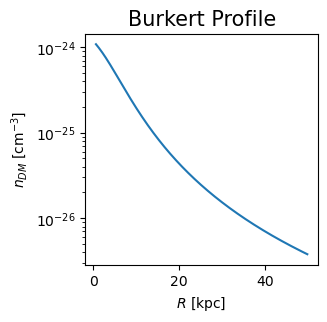

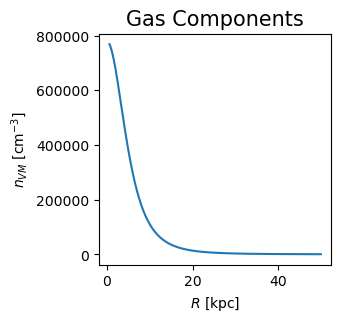

NSIDE is 32
NPIX is 12288
dOmega is 0.0010226538585904274
done


In [3]:
F_tot_galex = simulate_signal(m_aqn_kg)

In [4]:
F_tot_galex

<Quantity [0.15041413, 0.14693227, 0.14693227, ..., 0.14693227, 0.14693227,
           0.15041413] mK>

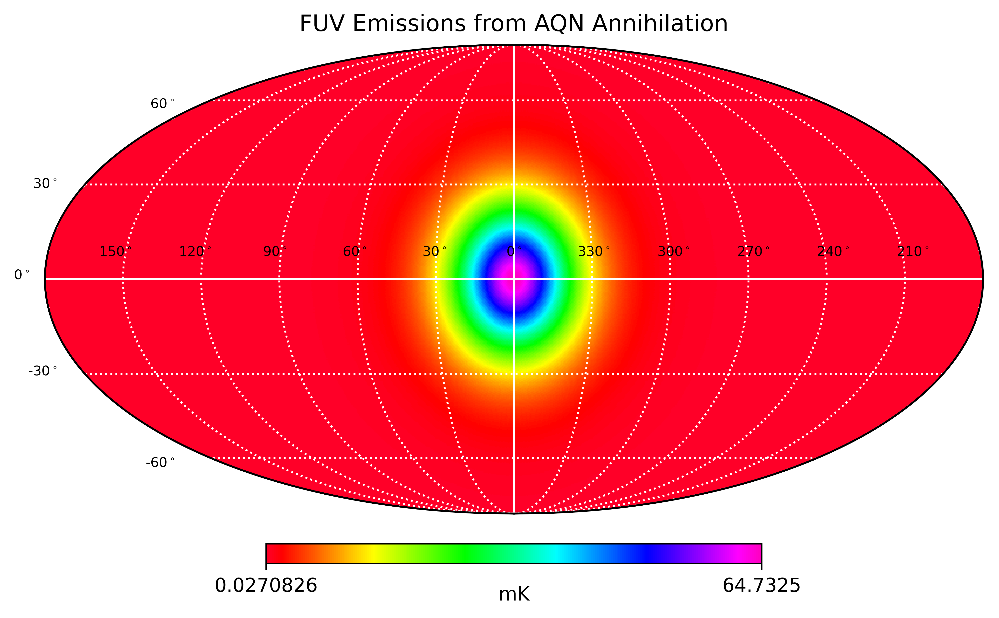

In [5]:
create_skymap2(F_tot_galex, F_tot_galex.unit, False)

In [6]:
test_signal = F_tot_galex.copy()

In [108]:
int(len(angular_dist_band)/2)

192

In [115]:
angular_dist_band[int(len(angular_dist_band)/2):]

array([6144, 6145, 6146, 6147, 6148, 6149, 6150, 6151, 6152, 6153, 6154,
       6155, 6156, 6157, 6158, 6159, 6160, 6161, 6162, 6163, 6164, 6165,
       6166, 6167, 6168, 6169, 6170, 6171, 6172, 6173, 6174, 6175, 6176,
       6177, 6178, 6179, 6180, 6181, 6182, 6183, 6184, 6185, 6186, 6187,
       6188, 6189, 6190, 6191, 6192, 6193, 6194, 6195, 6196, 6197, 6198,
       6199, 6200, 6201, 6202, 6203, 6204, 6205, 6206, 6207, 6208, 6209,
       6210, 6211, 6212, 6213, 6214, 6215, 6216, 6217, 6218, 6219, 6220,
       6221, 6222, 6223, 6224, 6225, 6226, 6227, 6228, 6229, 6230, 6231,
       6232, 6233, 6234, 6235, 6236, 6237, 6238, 6239, 6240, 6241, 6242,
       6243, 6244, 6245, 6246, 6247, 6248, 6249, 6250, 6251, 6252, 6253,
       6254, 6255, 6256, 6257, 6258, 6259, 6260, 6261, 6262, 6263, 6264,
       6265, 6266, 6267, 6268, 6269, 6270, 6271, 6272, 6273, 6274, 6275,
       6276, 6277, 6278, 6279, 6280, 6281, 6282, 6283, 6284, 6285, 6286,
       6287, 6288, 6289, 6290, 6291, 6292, 6293, 62

In [119]:
wmaphaze

array([0.0672616 , 0.06445695, 0.07018433, ..., 0.05552057, 0.06659865,
       0.0627377 ], dtype=float32)

In [166]:
# np.concatenate(
#     (hp.ang2pix(N, [np.pi/2+2*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2-2*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2-hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2+hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000))))

In [39]:
test_signal = F_tot_galex.copy()
# test_signal = wmaphaze.copy() * u.mK

N = 2**9

vec = hp.ang2vec(np.pi/2, 0)
min_angle = 3
max_angle = 37

angles = np.arange(3,38,1)
num_angles = len(angles)

# angular_dist_band = hp.query_strip(N,np.pi/2-2*hp.nside2resol(N), np.pi/2+2*hp.nside2resol(N), inclusive=False)



# angular_dist_band = np.unique(np.concatenate(
#     (hp.ang2pix(N, [np.pi/2+2*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2-2*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2-hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
#      hp.ang2pix(N, [np.pi/2+hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)))))

# for N=2**7, 2**8
lower_bound = -np.radians(min_angle)
upper_bound = -np.radians(max_angle)
angular_dist_band = np.unique(np.concatenate(
    (hp.ang2pix(N, [np.pi/2+2*hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2-2*hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2-hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2+hp.nside2resol(N)]*10000, np.linspace(lower_bound,upper_bound,10000)),
     hp.ang2pix(N, [np.pi/2]*10000, np.linspace(lower_bound,upper_bound,10000)))))


     # hp.ang2pix(N, [np.pi/2+3*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000)),
     # hp.ang2pix(N, [np.pi/2-3*hp.nside2resol(N)]*10000, np.linspace(np.pi,2*np.pi,10000))

# test_signal[angular_dist_band]= np.nan
# f1 = plt.figure(dpi=100)
# hp.mollview(test_signal.value, 
#                     title="FUV Emissions from AQN Annihilation", 
#                     rot=(0,0,0),
#                     fig=f1, 
#                     unit="")
# plt.show()


strip_pixel_refs = {}
strip_index_refs = {}

for i in range(num_angles):
    radius_inner = np.radians(angles[i])
    radius_outer = np.radians(angles[i] + 1)

    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)

    strip_pixel_ref = np.intersect1d(pix_ring, angular_dist_band)
    # print(len(strip_pixel_ref))

    # plotter_signal = test_signal.copy()
    # plotter_signal[strip_pixel_ref] = np.nan
    
    strip_pixel_refs[angles[i]] = strip_pixel_ref
    strip_index_refs[angles[i]] = [j for j in range(len(angular_dist_band)) if angular_dist_band[j] in strip_pixel_ref]
    # f1 = plt.figure(dpi=100)
    # hp.mollview(plotter_signal.value, 
    #                     title="FUV Emissions from AQN Annihilation", 
    #                     rot=(0,0,0),
    #                     fig=f1, 
    #                     unit="")
    # plt.show()

In [40]:
# strip_pixel_refs stores the hp indecies of the filtered pixels,
# strip_index_refs stores the angular_dist_band indecies of the filtered pixels
angular_dist_band[strip_index_refs[5]]

array([1565662, 1565663, 1565664, 1565665, 1565666, 1565667, 1567710,
       1567711, 1567712, 1567713, 1567714, 1567715, 1569758, 1569759,
       1569760, 1569761, 1569762, 1569763, 1571806, 1571807, 1571808,
       1571809, 1571810, 1571811, 1573854, 1573855, 1573856, 1573857,
       1573858, 1573859, 1575902, 1575903, 1575904, 1575905, 1575906,
       1575907, 1577950, 1577951, 1577952, 1577953, 1577954, 1577955,
       1579998, 1579999, 1580000, 1580001, 1580002, 1580003, 1582046,
       1582047, 1582048, 1582049, 1582050, 1582051])

In [33]:
len(angular_dist_band)

113

In [37]:
strip_pixel_refs[5]

array([6078, 6334])

In [121]:
sun_mw_distance_kpc = 8*u.kpc

dm_model = "Burkert Profile"
vm_model = "Gas Components"
l_min = 0.6
l_max = 50
dl =0.5*u.kpc
NSIDE = 2**9
ionized_gas = True

T_warm     = (3e4 + 1e5)/2 * u.K * K_to_eV

T_warm_hot = (1e5 + 1e6)/2 * u.K * K_to_eV

T_hot      = 1e6 * u.K * K_to_eV


spectral_surface_emissivity_u_factor = (1 / cst.hbar.cgs) * (1/(cst.hbar.cgs * cst.c.cgs))**2 * (cst.hbar.cgs * 1/u.Hz * 1/u.s)

from astropy.cosmology import WMAP7             # WMAP 7-year cosmology
rho_crit_z05_cgs = WMAP7.critical_density(0.5)  # critical density at z = 0.5  
rho_crit_z05_si = rho_crit_z05_cgs.to(u.kg / u.m**3)
r_vir_kpc = 233 * u.kpc

# some resolution parameters
print("NSIDE is", NSIDE)
#NSIDE = 2**6
wavelength_band_resolution = 30
#frequency_band_resolution = 0.5e14

frequency_band_resolution = 1e9


NPIX = hp.nside2npix(NSIDE)
print("NPIX is", NPIX)
dOmega = hp.nside2pixarea(nside=NSIDE)
print("dOmega is", dOmega)

# array of theta, phi, for each pixel
theta, phi = hp.pix2ang(nside = NSIDE, ipix = list(range(NPIX)))

theta = theta[angular_dist_band]
phi = phi[angular_dist_band]

# frequency band
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz


# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]

# 2D array of distance elements along each sightline, sun-centric
l_array = np.ones((len(l_list),len(theta))) * l_list

# 2D array of distance elements along each sightline, galaxy-centric
x = l_array * np.sin(theta) * np.cos(phi) - sun_mw_distance_kpc.value
y = l_array * np.sin(theta) * np.sin(phi)
z = l_array * np.cos(theta)
R_array = np.sqrt(x**2 + y**2 + z**2)

def spectral_surface_emissivity(T, frequency_band):
    res = np.zeros(np.shape(T)) * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr# # 
    res[T<0] = -1 * u.mK #* skymap_units / u.sr # u.photon / u.cm**2 / u.s / u.Angstrom / u.sr  # * u.erg/u.Hz/u.s/u.cm**2/u.sr 
    f = frequency_band[0]
    T = T * eV_to_erg
    for i in range(len(frequency_band)):
        w_div_T = (2*np.pi*Hz_to_erg)*frequency_band[i] / T
        res_new = spectral_surface_emissivity_u_factor * 4/45 * \
                    T[T>0]**3 * cst.alpha ** (5/2) * 1/np.pi * \
                   (T[T>0]/(m_e_eV*eV_to_erg))**(1/4) * \
                   (1 + w_div_T[T>0]) * np.exp(- w_div_T[T>0]) * h(w_div_T[T>0]) * 1/(dOmega*u.sr)
        res_new = convert_to_skymap_units(res_new, frequency_band[i]).to(u.mK, equivalencies = u.brightness_temperature(frequency_band[i]))
        res[T>0] += res_new #* conversion_array[i] 
    return res 


def spectral_spatial_emissivity_cold(n_AQN, n_bar, Dv, f, g, frequency_band):
    T_AQN = T_AQN_analytical(n_bar, Dv, f, g)
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    return dFdw 

def spectral_spatial_emissivity_hot(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return dFdw

def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN

def func(n_aqn_cm3, n_c, n_w, n_wh,n_h, frequency_band):
    #print(spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band).unit)
    epsilon = (spectral_spatial_emissivity_cold(n_aqn_cm3, n_c,  Dv, f, g,                    frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_w,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_wh, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band) +
               spectral_spatial_emissivity_hot( n_aqn_cm3, n_h,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band))* \
        4 * np.pi * R_aqn_cm**2 * n_aqn_cm3.to(1/u.cm**3)
    return epsilon #.value

h_func_cutoff = 17 + 12*np.log(2)
def h(x):
    return_array = np.copy(x)
    return_array[np.where(x<1)] = (17 - 12*np.log(x[np.where(x<1)]/2))
    return_array[np.where(x>=1)] = h_func_cutoff
    return return_array


[a1_c, b1_c, c1_c, 
 a2_c, b2_c, c2_c, 
 a3_c, b3_c, c3_c, 
 a4_c, b4_c, c4_c, 
 a5_c, b5_c, c5_c, 
 a6_c, b6_c, c6_c] = [30.04649796,  0.4079755,  3.77607598,  
              1e3,3e-1,15,
             2.6e4,5e-2,3,
             0,0,0,
             0,0,0,
             0,0,0,]

[a1_w, b1_w, c1_w, 
 a2_w, b2_w, c2_w, 
 a3_w, b3_w, c3_w, 
 a4_w, b4_w, c4_w, 
 a5_w, b5_w, c5_w, 
 a6_w, b6_w, c6_w] = [1.1e0,1e-1,0.22,
              1.7e1,12e-1,110,
              0.575e4,8.2e-2,13.7,
             0,0,0,
             0,0,0,
             0,0,0,]

[a1_wh, b1_wh, c1_wh, 
 a2_wh, b2_wh, c2_wh, 
 a3_wh, b3_wh, c3_wh, 
 a4_wh, b4_wh, c4_wh, 
 a5_wh, b5_wh, c5_wh, 
 a6_wh, b6_wh, c6_wh] = [6.1e1,4.4e-1,1.8,
              9e2,9.2e-2,2.8,
              1.5e4,7e-2,9,
             0,0,0,
             0,0,0,
             0,0,0,]

[a1_h, b1_h, c1_h, 
 a2_h, b2_h, c2_h, 
 a3_h, b3_h, c3_h, 
 a4_h, b4_h, c4_h, 
 a5_h, b5_h, c5_h, 
 a6_h, b6_h, c6_h] = [2e2,4e-1,9.5,
              1e4,10e-2,6,
              2.6e4,3e-2,3.1,
              0,0,0,
              0,0,0,
              0,0,0,]


def rho_gas_component(R_kpc,gas_component):
    x = (R_kpc/r_vir_kpc).value
    if gas_component == "cold":
        return  (a1_c / (1+(x/b1_c)**2)**c1_c + \
                 a2_c / (1+(x/b2_c)**2)**c2_c + \
                 a3_c / (1+(x/b3_c)**2)**c3_c) * rho_crit_z05_si
    if gas_component == "warm":
        return  (a1_w / (1+(x/b1_w)**2)**c1_w + \
                 a2_w / (1+(x/b2_w)**2)**c2_w + \
                 a3_w / (1+(x/b3_w)**2)**c3_w) * rho_crit_z05_si
    if gas_component == "warm-hot":
        return  (a1_wh / (1+(x/b1_wh)**2)**c1_wh + \
                 a2_wh / (1+(x/b2_wh)**2)**c2_wh + \
                 a3_wh / (1+(x/b3_wh)**2)**c3_wh) * rho_crit_z05_si 
    if gas_component == "hot":
        return  (a1_h / (1+(x/b1_h)**2)**c1_h + \
                 a2_h / (1+(x/b2_h)**2)**c2_h + \
                 a3_h / (1+(x/b3_h)**2)**c3_h) * rho_crit_z05_si 

def n_gas_component(R_none, gas_component):
    return rho_gas_component(R_none*u.kpc, gas_component) / cst.m_p.si


def rho_gas(R_none):
    return rho_gas_component(R_none,"cold") + rho_gas_component(R_none,"warm") + rho_gas_component(R_none,"warm-hot") + rho_gas_component(R_none,"hot")

def n_vm(R_none):
    return rho_gas(R_none) / cst.m_p.si

# ########### NFW Profile #############################################
if dm_model == "NFW Profile":
    rho_0h = 0.0106 * u.solMass / u.pc**3
    r_h = 19.0 * u.kpc

    def rho_halo(R_kpc):
        return rho_0h.to(u.kg/u.m**3) / ((R_kpc/r_h)*(1+R_kpc/r_h)**2)

    def n_halo(R_none):
        return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# #####################################################################

# # ########### constant density #########################################
if dm_model == "Constant DM density":
    n_aqn_const_cm3 = 0.3/1e25 * u.cm**-3
    def n_halo(R_none):
        return np.ones(np.shape(R_none)) * n_aqn_const_cm3
# # ######################################################################

# ########### Burkert Profile #########################################
# if dm_model == "Burkert Profile":
#     vh = 414 * u.km / u.s
#     r0 = 7.8 * u.kpc
#     rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)

#     def rho_halo(R_kpc):
#         return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

#     def n_halo(R_none):
#         return (rho_halo(R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
# ######################################################################

########### Burkert Profile #########################################
if dm_model == "Burkert Profile":
    # vh = 414# * u.km / u.s
    # r0 = 7.8# * u.kpc

    def rho_halo(vh, r0, R_kpc):
        rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)
        return rho0 * r0**3 / ( (R_kpc+r0)*((R_kpc)**2 + r0**2) )

    def n_halo(m_aqn_kg, vh, r0, R_none):
        return (rho_halo(vh*u.km/u.s, r0*u.kpc, R_none*u.kpc) / m_aqn_kg).to(1/u.cm**3)
######################################################################


############# constant density ######################################### 
if vm_model == "Constant VM density":
    n_cold_cm3 = 1.0e-1 * u.cm**-3
    def n_vm(R_none):
        return np.ones(np.shape(R_none)) * n_cold_cm3
########################################################################


def simulate_signal(m_aqn_kg, vh, r0):

    R_aqn_cm = calc_R_AQN(m_aqn_kg)
    
    # calculate AQN number density
    n_aqn_cm3 = n_halo(m_aqn_kg, vh, r0, R_array)



    # calculate mass densities of each gas component
    n_cold     = n_gas_component(R_array, "cold") 

    n_warm     = n_gas_component(R_array, "warm") # avoid setting variables

    n_warm_hot = n_gas_component(R_array, "warm-hot")

    n_hot      = n_gas_component(R_array, "hot")


    F_tot_galex = sum(func(n_aqn_cm3, n_cold,n_warm,n_warm_hot,n_hot, frequency_band)) / (4*np.pi) * (dl.cgs) * dOmega

    #print("done")

    return F_tot_galex

NSIDE is 512
NPIX is 3145728
dOmega is 3.994741635118857e-06


In [64]:
vh = 414 #* u.km / u.s
r0 = 7.8 #* u.kpc
# rho0 = (vh**2 / (4*np.pi * r0**2 * cst.G)).to(u.kg/u.m**3)
# r0


In [67]:
g = 0.1

In [70]:
F_tot_band = simulate_signal(m_aqn_kg, vh, r0)


done


In [44]:
len(F_tot_band)

1746

In [45]:
angular_flux_aqn = np.zeros(num_angles)
for i in range(num_angles):
    F_selected_pixels = F_tot_band[strip_index_refs[angles[i]]]
    angular_flux_aqn[i] = np.average(F_selected_pixels.value)


In [46]:
N = 2**5

angular_flux_aqn_skymap = np.zeros(num_angles)

for i in range(num_angles):
    radius_inner = np.radians(angles[i])
    radius_outer = np.radians(angles[i] + 1)

    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)

    angular_flux_aqn_skymap[i] = np.average(F_tot_galex[pix_ring]).value

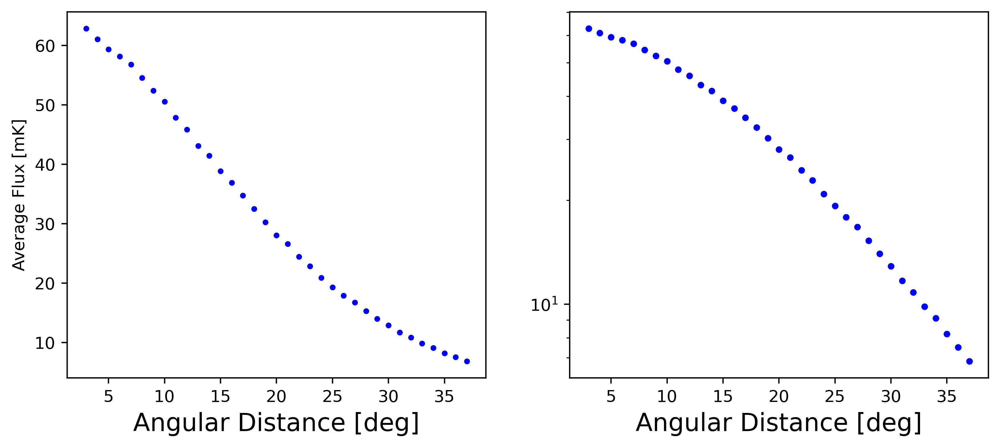

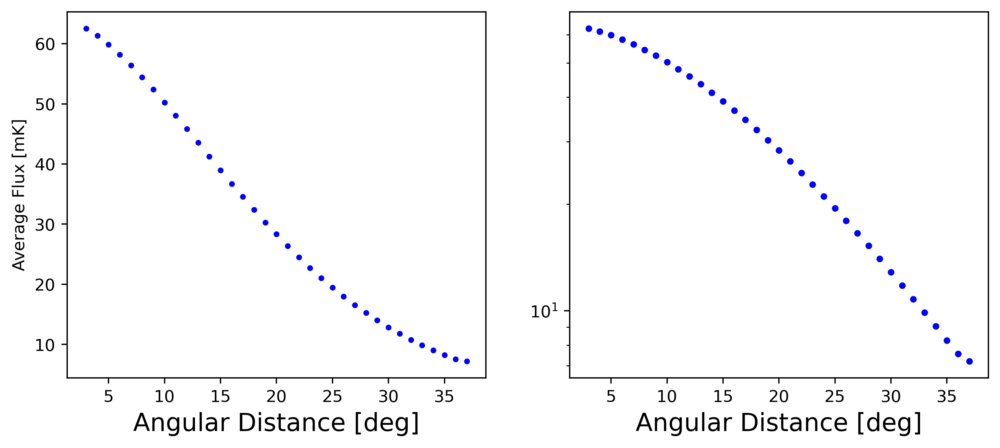

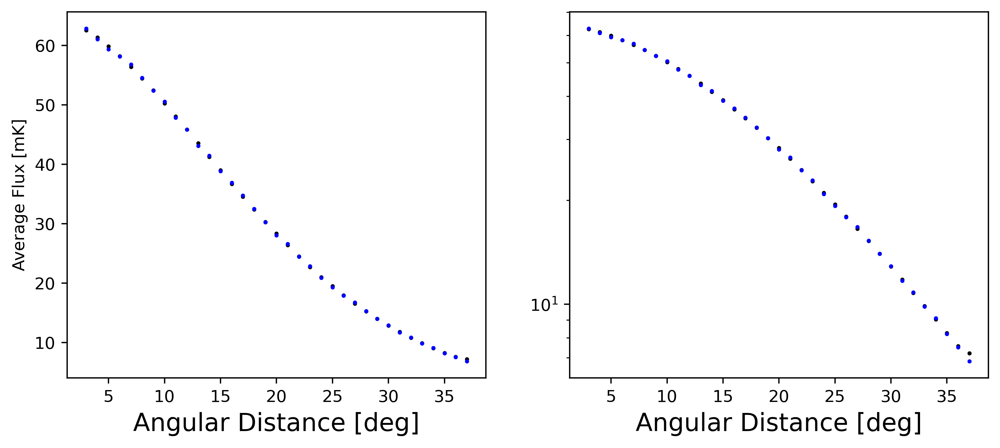

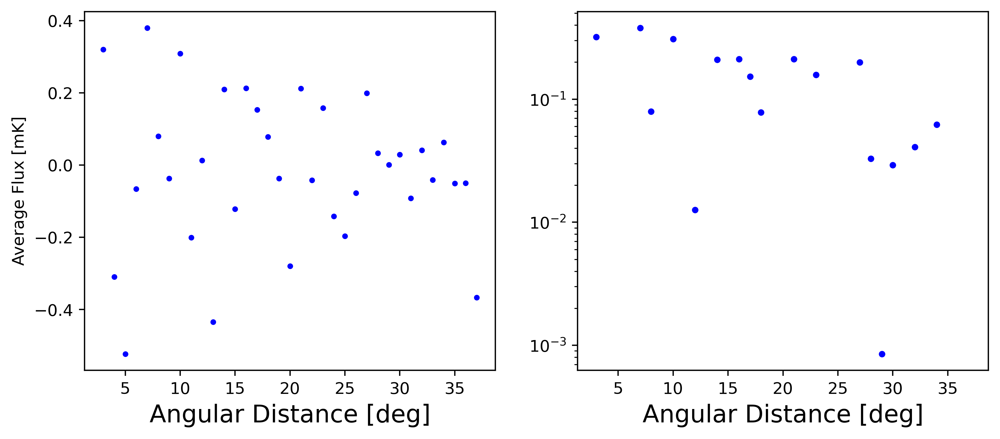

In [47]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn_skymap, marker=".", markersize=5, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn_skymap, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/skymap_first.svg")
plt.savefig("plots/skymap_first.png")
plt.show()


# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn, marker=".", markersize=5, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/filter_first.svg")
plt.savefig("plots/filter_first.png")
plt.show()


# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn, marker=".", markersize=3, linestyle = 'none',color='black')
ax1.plot(angles,angular_flux_aqn_skymap, marker=".", markersize=3, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn, '.', color='black', markersize=3)
ax2.plot(angles,angular_flux_aqn_skymap, '.', color='blue', markersize=3)
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/skymap_vs_filter.svg")
plt.savefig("plots/skymap_vs_filter.png")
plt.show()



# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=400)

# Plot the data on the left subplot
ax1.plot(angles,angular_flux_aqn_skymap-angular_flux_aqn, marker=".", markersize=5, linestyle = 'none',color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]')

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(angles,angular_flux_aqn_skymap-angular_flux_aqn, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.savefig("plots/skymap_minus_filter.svg")
plt.savefig("plots/skymap_minus_filter.png")
plt.show()

<ErrorbarContainer object of 3 artists>

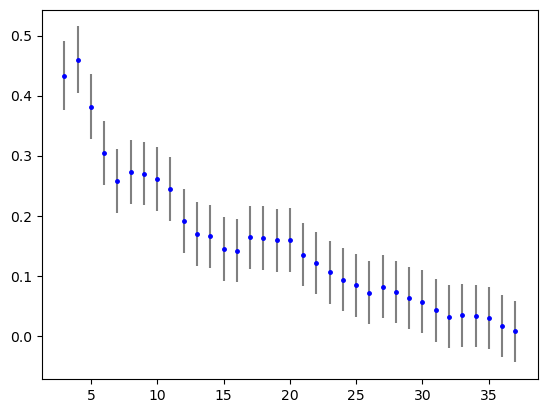

In [48]:
# Importing WMAP Haze data
# .fits file taken from https://faun.rc.fas.harvard.edu/dfink/skymaps/haze/table/
location = "/data4/msekatchev/wmaphaze/"
location = "WMAP/"
filename = "wmap_k_ffhaze_yr1.fits"
wmaphaze = hp.read_map(location + filename)


N = 2**9
# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)
min_angle = 3
max_angle = 91

angles_prelim = np.arange(3,91,1)
num_angles_prelim = len(angles_prelim)

angular_flux_wmap = np.zeros(num_angles_prelim)
angular_flux_wmap_error = np.zeros(num_angles_prelim)


for i in range(num_angles_prelim):
    radius_inner = np.radians(angles_prelim[i])
    radius_outer = np.radians(angles_prelim[i] + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    unfiltered_signal = wmaphaze[pix_ring]
    filtered_signal = unfiltered_signal[unfiltered_signal != 0]
    
    
    angular_flux_wmap[i] = np.average(filtered_signal)
    # print("i=",i,"\tangle:",angles[i],"\t",angular_flux_wmap[i])
    n_pixels = len(filtered_signal)
    angular_flux_wmap_error[i] = np.std(filtered_signal) / np.sqrt(n_pixels)

cov_matrix = np.zeros([num_angles,num_angles])

for i in range(num_angles):
    cov_matrix[i,i] = angular_flux_wmap_error[i]**2
cov_matrix


error_threshold_filter = 35

shifted_error = np.average(angular_flux_wmap[error_threshold_filter:])
shifted_error


angular_flux_wmap = angular_flux_wmap[:error_threshold_filter] - shifted_error
angular_flux_wmap_error = angular_flux_wmap_error[:error_threshold_filter] + shifted_error

plt.errorbar(angles,
             angular_flux_wmap, 
             yerr=angular_flux_wmap_error, 
             marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

In [16]:
# N = 2**5

# angular_flux_aqn = np.zeros(num_angles)

# for i in range(num_angles):
#     radius_inner = np.radians(angles[i])
#     radius_outer = np.radians(angles[i] + 1)
    
#     pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
#     pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

#     pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
#     angular_flux_aqn[i] = np.average(F_tot_galex[pix_ring]).value
    
# #     if (angles[i]+1) % 10 == 0:
# #         f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
# #         plot_with_ring = F_tot_galex.value.copy()
# #         plot_with_ring[pix_ring] = np.nan
# #         hp.mollview(plot_with_ring , 
# #                     title=str(angles[i]+1) + " deg", 
# #                     rot=(0,0,0), 
# #                     fig=f1, 
# #                     unit="")
# #         plt.show()

# # # Create a figure with two subplots side by side
# # fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=200)

# # # Plot the data on the left subplot
# # ax1.plot(angles,angular_flux_aqn, '.', color='blue')
# # ax1.set_xlabel('Angular Distance [deg]', size=15)
# # ax1.set_ylabel('Average Flux [mK]', size=15)

# # # Plot the data on the right subplot with a log scale on the y-axis
# # ax2.plot(angles,angular_flux_aqn, '.', color='blue')
# # ax2.set_xlabel('Angular Distance [deg]', size=15)
# # ax2.set_yscale('log')

# # # Show the plot
# # plt.show()
        


In [42]:
np.shape(cov_mat)
cov_mat

array([[ 1.02398834e-10,  5.88039860e-12,  4.27449125e-12, ...,
         1.81413107e-13,  9.17047972e-14,  8.63542728e-14],
       [ 5.88039860e-12,  5.12161115e-11,  2.04231588e-12, ...,
        -1.24435724e-13, -3.60319515e-14,  2.06546576e-14],
       [ 4.27449125e-12,  2.04231588e-12,  2.95504682e-11, ...,
        -4.28260497e-14, -5.62416654e-14,  2.94559222e-14],
       ...,
       [ 1.81413107e-13, -1.24435724e-13, -4.28260497e-14, ...,
         6.29737674e-14,  7.94727759e-15,  5.68885756e-15],
       [ 9.17047972e-14, -3.60319515e-14, -5.62416654e-14, ...,
         7.94727759e-15,  4.04240830e-14,  5.84392069e-15],
       [ 8.63542728e-14,  2.06546576e-14,  2.94559222e-14, ...,
         5.68885756e-15,  5.84392069e-15,  3.35003089e-14]])

In [47]:
angular_flux_wmap

array([0.48447528, 0.5112415 , 0.43241593, 0.35517389, 0.30850428,
       0.32423732, 0.3213836 , 0.31280178, 0.29554474, 0.24199744,
       0.22024083, 0.21664691, 0.1955432 , 0.19287767, 0.21501245,
       0.21363355, 0.20989229, 0.2103523 , 0.18588735, 0.17222463,
       0.15702452, 0.14465117, 0.13511123, 0.12277125, 0.13269645,
       0.12408793, 0.11360628, 0.10807002, 0.0932776 , 0.08315664,
       0.08487278, 0.08397961, 0.08020521, 0.06801356, 0.05820386,
       0.05610891, 0.05710904, 0.05865419, 0.05356881, 0.05125547,
       0.05409576, 0.0507937 , 0.04845238, 0.05277993, 0.04738102,
       0.04491454, 0.04018902, 0.04126115, 0.04480294, 0.05202834,
       0.04742068, 0.04331195, 0.04478889, 0.04531575, 0.04512496,
       0.04432163, 0.0453601 , 0.04371953, 0.04229074, 0.04515244,
       0.0509683 , 0.05142463, 0.05106229, 0.05175943, 0.05643101,
       0.05426818, 0.04998509, 0.05370452, 0.06041697, 0.05746241,
       0.05745833, 0.05828459, 0.05525091, 0.05303882, 0.05354

In [72]:
r0

7.8

In [117]:
import numpy as np
import emcee
import sys
# parallel computation with multiple cpus, remove that if you don't need it
from multiprocessing import Pool,cpu_count

# following are functions I used, remove them if you don't want to install anything
import pyccl as ccl

# plotting functions
# # %matplotlib inline
# # %config InlineBackend.figure_format = 'retina'
import matplotlib.pyplot as plt
from getdist import plots, MCSamples; import getdist # one triangle plotter
import corner # another triangle plotter

# hereby is the observation vector I need to read, please switch this to your observations
vec = angular_flux_wmap
observation = angular_flux_wmap
cov_mat = cov_matrix
inv_cov = np.linalg.inv(cov_mat) # my inverse covariance matrix

# define your parameter names, default values, and posterior names here, these are currently mine
parameter_names = ['$m$', '$v_h$', "r_0"]
values_ori = [0.01, 414, 7.8] # ???????

# def theory_function(theory_parameters):
#     m, vh, r0 = theory_parameters
    
#     F_tot_galex = simulate_signal(m * u.kg, vh, r0)
    
#     N = 2**5

#     angular_flux_aqn = np.zeros(num_angles)

#     for i in range(num_angles):
#         radius_inner = np.radians(angles[i])
#         radius_outer = np.radians(angles[i] + 1)

#         pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
#         pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

#         pix_ring = np.setdiff1d(pix_outer, pix_inner)

#         angular_flux_aqn[i] = np.average(F_tot_galex[pix_ring]).value
    
#     return angular_flux_aqn

print("hello")
def theory_function(theory_parameters):
    m, vh, r0 = theory_parameters
    
    F_tot_band = simulate_signal(m * u.kg, vh, r0)

    angular_flux_aqn = np.zeros(num_angles)

    for i in range(num_angles):
        F_selected_pixels = F_tot_band[strip_index_refs[angles[i]]]
        angular_flux_aqn[i] = np.average(F_selected_pixels.value)
    
    return angular_flux_aqn


def prior(theory_parameters):
    # prior of my example function, as a flat prior, you can switch it to another likelihood for gaussian prior
    m, vh, r0 = theory_parameters
    #print(m,"\n")
    if m <= 0:
        return -np.inf
    
    logm = np.log10(m)
    prior = 0
    #print("m=", m, "\t log(m)=", logm, "\n")
    if logm < -3 or logm > 3: # we don't want parameters exceed that range
        prior += -np.inf
    return prior

def mcmc_emcee(theory_parameters):
    # don't change this part
    prior_value = prior(theory_parameters)
    if np.isinf(prior_value) == False:
        theory = theory_function(theory_parameters)
        difference = theory - observation
        lgprob = -0.5*float(difference @ inv_cov @ difference) + prior_value
    else:
        lgprob = -np.inf
    return lgprob

initial_guess = [0.01, 414, 7.8]
# my initial guess of the parameter space

nwalkers = 2*len(initial_guess) # number of mcmc walkers, need to be bigger than 2*parameter dimensions
nsteps = 50 # iteration numbers, you can adjust this to find a precision-speed balance, emcee don't automatically converge...
ndim = len(initial_guess) # number of parameters
starting_pts = [initial_guess + 1e-2*np.random.randn(ndim) for i in range(nwalkers)] # initial points for each walkers
with Pool() as pool: # parallelization, remove this if you only want 1 cpu
    sampler = emcee.EnsembleSampler(nwalkers,ndim,mcmc_emcee,pool=pool) # define your sampler, remove pool=pool if you only want 1 cpu
    sampler.run_mcmc(starting_pts,nsteps,progress=True) 
    # run your mcmc, you can monitor that via a progress bar if you have some package (that I forgot) installed
    # otherwise you need to set progress=False
burnout = int(0.1*nsteps) # burn out points for MCMC for each walkers, 0.1 is just a tradition
analysis_chain = sampler.flatchain[nwalkers*burnout:]
np.save('./sample_0.npy',sampler.flatchain) # here saves your sampled posterior chain files

# # From here I can tell you how to interpret this chain:
# # The analysis chain forms a multi-dimensional histogram of the posterior distribution:
posterior_means = np.average(np.array(analysis_chain),axis=0) # use posterior mean instead of max posterior, which is what mcmc bad at to find
posterior_std = np.std(np.array(analysis_chain),axis=0)
toprint = 'The constraints are:'
for i in range(ndim):
    toprint = toprint+parameter_names[i]+'='+str(posterior_means[i])[:5]+'+-'+str(posterior_std[i])[:4]+"\n"
print(toprint)










hello
done
done
done
done


  0%|          | 0/50 [00:00<?, ?it/s]

done
done


/opt/conda/lib/python3.9/site-packages/emcee/moves/red_blue.py:99: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]


done
donedone



  2%|▏         | 1/50 [00:03<02:31,  3.09s/it]

done
done
done
done
done


  4%|▍         | 2/50 [00:06<02:29,  3.11s/it]

done
done
done
done
done
done


  6%|▌         | 3/50 [00:09<02:24,  3.08s/it]

done
done
done
done
donedone



  8%|▊         | 4/50 [00:12<02:23,  3.11s/it]

done
done
done
done
done


 10%|█         | 5/50 [00:15<02:17,  3.05s/it]

done
done
done
done
done


 12%|█▏        | 6/50 [00:18<02:12,  3.02s/it]

done
done
done
done
done


 14%|█▍        | 7/50 [00:21<02:08,  2.98s/it]

done
done
done
done
done
done


 16%|█▌        | 8/50 [00:24<02:04,  2.96s/it]

done
done
done
done
done
done


 18%|█▊        | 9/50 [00:27<02:00,  2.95s/it]

done
done
done
done
done
done


 20%|██        | 10/50 [00:30<01:59,  3.00s/it]

done
donedone

done
done
done


 22%|██▏       | 11/50 [00:33<01:57,  3.02s/it]

done
done
done
done
done


 24%|██▍       | 12/50 [00:36<01:54,  3.00s/it]

done
done
done
done
done


 26%|██▌       | 13/50 [00:39<01:51,  3.01s/it]

done
done
done
done
done


 28%|██▊       | 14/50 [00:42<01:48,  3.00s/it]

done
done
done
done
done
done


 30%|███       | 15/50 [00:45<01:45,  3.02s/it]

done
done
done
donedone

done


 32%|███▏      | 16/50 [00:48<01:43,  3.03s/it]

done
done
done
done


 34%|███▍      | 17/50 [00:51<01:38,  2.99s/it]

done
done
done
done
done


 36%|███▌      | 18/50 [00:54<01:34,  2.96s/it]

done
done
done
done
done
done


 38%|███▊      | 19/50 [00:57<01:32,  2.97s/it]

done
done
done
done


 40%|████      | 20/50 [00:59<01:27,  2.91s/it]

done
done
done
done
done
done


 42%|████▏     | 21/50 [01:02<01:24,  2.93s/it]

done
donedone

done
done
done


 44%|████▍     | 22/50 [01:05<01:22,  2.96s/it]

done
done
done
done
done
done


 46%|████▌     | 23/50 [01:08<01:20,  2.96s/it]

done
done
done
done
done
done


 48%|████▊     | 24/50 [01:11<01:17,  2.97s/it]

done
done
done
done
done
done


 50%|█████     | 25/50 [01:14<01:14,  2.99s/it]

done
done
done
done
done
done


 52%|█████▏    | 26/50 [01:17<01:12,  3.01s/it]

done
done
done
done
done


 54%|█████▍    | 27/50 [01:20<01:09,  3.00s/it]

donedone

done
done


 56%|█████▌    | 28/50 [01:23<01:04,  2.91s/it]

done
done
done
done
done


 58%|█████▊    | 29/50 [01:26<01:01,  2.93s/it]

done
done
done
done
done


 60%|██████    | 30/50 [01:29<00:59,  2.97s/it]

done
done
done
done
donedone



 62%|██████▏   | 31/50 [01:32<00:56,  2.97s/it]

done
done
done
done
done
done


 64%|██████▍   | 32/50 [01:35<00:53,  2.96s/it]

done
done
done
done
done
done


 66%|██████▌   | 33/50 [01:38<00:50,  2.96s/it]

done
done
done
done
done
done


 68%|██████▊   | 34/50 [01:41<00:47,  2.94s/it]

done
done
done
done
done
done


 70%|███████   | 35/50 [01:44<00:43,  2.93s/it]

done
done
done
done
done
done


 72%|███████▏  | 36/50 [01:47<00:41,  2.98s/it]

done
done
done
done
done
done


 74%|███████▍  | 37/50 [01:50<00:38,  2.97s/it]

done
done
done
done
done
done


 76%|███████▌  | 38/50 [01:53<00:36,  3.00s/it]

done
done
done
done
done
done


 78%|███████▊  | 39/50 [01:56<00:32,  3.00s/it]

done
done
done
done
donedone



 80%|████████  | 40/50 [01:59<00:29,  2.97s/it]

done
done
done
done
done
done


 82%|████████▏ | 41/50 [02:02<00:26,  2.96s/it]

donedone

done
done
done
done


 84%|████████▍ | 42/50 [02:05<00:23,  2.94s/it]

done
done
done
done
done
done


 86%|████████▌ | 43/50 [02:08<00:20,  2.95s/it]

done
done
done
done
done
done


 88%|████████▊ | 44/50 [02:11<00:17,  2.96s/it]

done
done
done
done
done
done


 90%|█████████ | 45/50 [02:14<00:14,  2.95s/it]

done
done
done
done
done
done


 92%|█████████▏| 46/50 [02:17<00:11,  2.95s/it]

done
done
done
done
done
done


 94%|█████████▍| 47/50 [02:19<00:08,  2.95s/it]

done
done
done
done
done
done


 96%|█████████▌| 48/50 [02:22<00:05,  2.93s/it]

done
done
done
done
done
done


 98%|█████████▊| 49/50 [02:25<00:02,  2.93s/it]

done
done
done
done
done
done


100%|██████████| 50/50 [02:28<00:00,  2.97s/it]

The constraints are:$m$=0.415+-0.35
$v_h$=414.2+-0.16
r_0=7.029+-0.86



In [118]:

theory_function([0.01,vh,r0]) - theory_function([0.001,vh,r0])

#simulate_signal(0.01*u.kg, vh, r0) - simulate_signal(0.001*u.kg, vh, r0)

done
done


array([-181.21310708, -177.6469022 , -173.30587817, -168.36884334,
       -163.04688912, -157.29654803, -151.32500944, -144.9270099 ,
       -138.40702198, -132.02353141, -125.25655762, -118.54724126,
       -111.88148996, -105.23971977,  -99.03936948,  -92.74919416,
        -86.58967054,  -80.9318704 ,  -75.27820337,  -69.81977115,
        -64.63091154,  -59.7571146 ,  -55.33041788,  -50.95163593,
        -46.88120661,  -43.22016575,  -39.63177985,  -36.32474373,
        -33.26116507,  -30.39688785,  -27.87792518,  -25.46137586,
        -23.21586809,  -21.25231821,  -20.24234079])

In [125]:
vh = 414

array([[-3.00000000e+00,  4.14000000e+02,  7.80000000e+00],
       [-2.68421053e+00,  4.14000000e+02,  7.80000000e+00],
       [-2.36842105e+00,  4.14000000e+02,  7.80000000e+00],
       [-2.05263158e+00,  4.14000000e+02,  7.80000000e+00],
       [-1.73684211e+00,  4.14000000e+02,  7.80000000e+00],
       [-1.42105263e+00,  4.14000000e+02,  7.80000000e+00],
       [-1.10526316e+00,  4.14000000e+02,  7.80000000e+00],
       [-7.89473684e-01,  4.14000000e+02,  7.80000000e+00],
       [-4.73684211e-01,  4.14000000e+02,  7.80000000e+00],
       [-1.57894737e-01,  4.14000000e+02,  7.80000000e+00],
       [ 1.57894737e-01,  4.14000000e+02,  7.80000000e+00],
       [ 4.73684211e-01,  4.14000000e+02,  7.80000000e+00],
       [ 7.89473684e-01,  4.14000000e+02,  7.80000000e+00],
       [ 1.10526316e+00,  4.14000000e+02,  7.80000000e+00],
       [ 1.42105263e+00,  4.14000000e+02,  7.80000000e+00],
       [ 1.73684211e+00,  4.14000000e+02,  7.80000000e+00],
       [ 2.05263158e+00,  4.14000000e+02

In [129]:
g = 0.1

analysis_chain_plot = sampler.flatchain#[nwalkers*burnout:]

m_array = np.linspace(-3,3,20)
vh = np.ones(len(m_array)) * 414
r0 = np.ones(len(m_array)) * 7.8

analysis_chain_plot = np.transpose([m_array, vh, r0])
analysis_chain_plot

plt.figure(dpi=100)
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

for i in range(len(analysis_chain_plot)):
    m,vh,r0 = analysis_chain_plot[i]
    angular_flux_aqn = theory_function([m,vh,r0])
    

    
    plt.plot(angles,
             angular_flux_aqn, 
             marker=".", markersize=5, linestyle = 'none',color='red')   
    plt.title("$m$ = "+str(m)+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
    
    plt.ylim([0,1])
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.savefig("plots/MCMC-results/all.png")

/opt/conda/lib/python3.9/site-packages/astropy/units/quantity.py:673: RuntimeWarning: invalid value encountered in power
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


In [133]:
g = 0.1

analysis_chain_plot = sampler.flatchain#[nwalkers*burnout:]

m_array = np.exp(np.linspace(-3,3,20))
vh = np.ones(len(m_array)) * 414
r0 = np.ones(len(m_array)) * 7.8

analysis_chain_plot = np.transpose([m_array, vh, r0])
analysis_chain_plot

plt.figure(dpi=100)
plt.errorbar(angles,
         angular_flux_wmap, 
         yerr=angular_flux_wmap_error, 
         marker=".", markersize=5, linestyle = 'none',color='blue', ecolor="gray")

for i in range(len(analysis_chain_plot)):
    print("./")
    m,vh,r0 = analysis_chain_plot[i]
    angular_flux_aqn = theory_function([m,vh,r0])
    

    
    plt.plot(angles,
             angular_flux_aqn, 
             marker=".", markersize=5, linestyle = 'none',label=str(round(m,2)))   
    #plt.title("$m$ = "+str(m)+"$v_h$ = "+str(vh)+"$r_0$="+str(r0))
    
    plt.ylim([0,1])
    
    # plt.savefig("plots/MCMC-results/"+str(i)+".png")
    # plt.close()
plt.legend()
plt.savefig("plots/MCMC-results/all.png")

./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./
./


In [52]:
np.log(0.01)

-4.605170185988091

In [96]:
#analysis_chain
print(MC_Sample_1.getTable(limit=1).tableTex())


\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$m$            } & $4.58^{-0.40}_{-4.6}       $\\

{\boldmath$v_h$          } & $422^{+41}_{-54}           $\\

{\boldmath$r_0            $} & $-9^{+63}_{-38}            $\\
\hline
\end{tabular}


In [123]:
parameter_names = ['$m$', '$v_h$', "r_0"]
# plot the triangle plot with getdist
MC_Sample_1 = MCSamples(samples=analysis_chain,names=parameter_names,label="Sample Name",settings={'mult_bias_correction_order':0,'smooth_scale_2D':0.5, 'smooth_scale_1D':0.5}) 
# Feel free to change these three ploting parameters
print(MC_Sample_1.getTable(limit=1).tableTex())
# You can also try printing a table with this function
# which gives mean (or median? I cannot remember) and assymetric error bars
# on each parameters
g = plots.get_subplot_plotter(width_inch=12)
g.settings.axes_fontsize=18
g.settings.axes_labelsize=25
g.settings.legend_fontsize=17
Chains_to_plot = [MC_Sample_1] # you can add more here if you want to plot more than one posteriors
g.triangle_plot(Chains_to_plot,filled=False, 
                # Also okay to have filled = [True,False,False]
                contour_colors=['darkred','limegreen','deepskyblue'], 
                # Your contour colours
                markers={'$\\Omega_m$':0.3165,'$\\sigma_8$':0.8120})
                # A thin dashed line that labels some value you want to see/compare with
g.export('MC_Sample_getdist.jpeg') # Change your output file name

# plot the triangle plot with corner, 
# note that -- it is only capable for plotting one set of posteriors as what I am aware of
fig=corner.corner(analysis_chain,smooth=1, # contour smoothness
                  levels=(0.68,0.95), # contour levels
                  bins=35, # bins of measuring pdfs on each dimension
                  labels='test_label',show_titles=True,title_fmt='.3f', 
                  # show asymmetric error bars on the plot title with median
                  label_kwargs={'fontsize':17},title_kwargs={'fontsize':17}) # fontsizes
axes = np.array(fig.axes).reshape((ndim, ndim))
for i in range(ndim): # line of default value on 1D pdf that you can compare with 
    ax = axes[i,i]
    ax.axvline(values_ori[i], color="orange")
for yi in range(ndim): # line of default value on 2D pdf that you can compare with 
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(values_ori[xi], color="orange")
        ax.axhline(values_ori[yi], color="orange")
        ax.plot(values_ori[xi], values_ori[yi], "orange")
    
fig.set_size_inches((10,10))
#fig.tight_layout()
fig.savefig('MC_Sample_corner.jpeg',dpi=300)


Removed no burn in
\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$m$            } & $0.42^{+0.31}_{-0.51}      $\\

{\boldmath$v_h$          } & $414.21\pm 0.17            $\\

{\boldmath$r_0            $} & $7.03^{+1.3}_{-0.67}       $\\
\hline
\end{tabular}


Removed no burn in
\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$m$            } & $0.0112^{+0.0036}_{-0.017} $\\
\hline
\end{tabular}


In [59]:
np.shape(observation)

(88,)

In [60]:
theory = theory_function(0.01)
difference = theory - observation

NSIDE is 32
NPIX is 12288
dOmega is 0.0010226538585904274
done


TypeError: unsupported operand type(s) for -: 'NoneType' and 'float'

In [63]:
print(theory)

None


In [24]:
# import numpy as np
# import emcee
# import sys
# # parallel computation with multiple cpus, remove that if you don't need it
# from multiprocessing import Pool,cpu_count

# # following are functions I used, remove them if you don't want to install anything
# import pyccl as ccl

# # plotting functions
# # %matplotlib inline
# # %config InlineBackend.figure_format = 'retina'
# import matplotlib.pyplot as plt
# from getdist import plots, MCSamples; import getdist # one triangle plotter
# import corner # another triangle plotter

# # hereby is the observation vector I need to read, please switch this to your observations
# vec = np.loadtxt('Correlations/SP1500_bootstrap_vec.dat')
# thetas,oxip,oxim,vxp,vxm = vec.T
# observation = np.append(oxip,oxim) # my observational vector
# cov_mat = np.loadtxt('Correlations/SP1500_bootstrap_cov.dat')
# inv_cov = np.linalg.inv(cov_mat) # my inverse covariance matrix

# # define your parameter names, default values, and posterior names here, these are currently mine
# parameter_names = ['$\\Omega_m$','$\\omega_b$','$\\sigma_8$','$h$','$n_s$'] 
# values_ori = [0.3165,0.0223,0.8120,0.6866,0.9662]
# sample_name = 'SP1500 Halofit'

# def theory_function(theory_parameters):
#     # hereby is an example function I used, please switch all this to your theoretical function
#     Omega_m, omega_b, sigma_8, h_0, n_s = theory_parameters
#     znz_file = np.loadtxt('Correlations/n_z_pdf_SP.txt')
#     znz_a = (znz_file[:,0],znz_file[:,1])
#     ell_arr = np.geomspace(10,10000,1024)
#     Omega_b = omega_b/h_0/h_0;Omega_c = Omega_m - Omega_b
#     cosmo = ccl.Cosmology(Omega_c = Omega_c, Omega_b = Omega_b, sigma8 = sigma_8, h = h_0, n_s = n_s)
#     W_k = ccl.WeakLensingTracer(cosmo,znz_a)
#     cl_arr = ccl.angular_cl(cosmo,W_k,W_k,ell_arr)
#     txip = ccl.correlation(cosmo,ell_arr,cl_arr,thetas/60.0,type='GG+',method='FFTLog')
#     txim = ccl.correlation(cosmo,ell_arr,cl_arr,thetas/60.0,type='GG-',method='FFTLog')
#     return np.append(txip,txim) # return one single data vector

# def prior(theory_parameters):
#     # prior of my example function, as a flat prior, you can switch it to another likelihood for gaussian prior
#     Omega_m, omega_b, sigma_8, h_0, n_s = theory_parameters
#     prior = 0
#     if Omega_m < 0.1 or Omega_m > 0.6 or omega_b < 0.02 or omega_b > 0.07: # we don't want parameters exceed that range
#         prior += -np.inf
#     if sigma_8 < 0.5 or sigma_8 > 1.5 or n_s < 0.8 or n_s > 1.1:
#         prior += -np.inf
#     if h_0 < 0.5 or h_0 > 0.9:
#         prior += -np.inf
#     return prior

# def mcmc_emcee(theory_parameters):
#     # don't change this part
#     prior_value = prior(theory_parameters)
#     if np.isinf(prior_value) == False:
#         theory = theory_function(theory_parameters)
#         difference = theory - observation
#         lgprob = -0.5*float(difference @ inv_cov @ difference) + prior_value
#     else:
#         lgprob = -np.inf
#     return lgprob

# initial_guess = [0.316,0.0425,0.811,0.687,0.966]
# # my initial guess of the parameter space

# nwalkers = 2*len(initial_guess) # number of mcmc walkers, need to be bigger than 2*parameter dimensions
# nsteps = 50 # iteration numbers, you can adjust this to find a precision-speed balance, emcee don't automatically converge...
# ndim = len(initial_guess) # number of parameters
# starting_pts = [initial_guess + 1e-1*np.random.randn(ndim) for i in range(nwalkers)] # initial points for each walkers
# with Pool() as pool: # parallelization, remove this if you only want 1 cpu
#     sampler = emcee.EnsembleSampler(nwalkers,ndim,mcmc_emcee,pool=pool) # define your sampler, remove pool=pool if you only want 1 cpu
#     sampler.run_mcmc(starting_pts,nsteps,progress=True) 
#     # run your mcmc, you can monitor that via a progress bar if you have some package (that I forgot) installed
#     # otherwise you need to set progress=False
# burnout = int(0.1*nsteps) # burn out points for MCMC for each walkers, 0.1 is just a tradition
# analysis_chain = sampler.flatchain[nwalkers*burnout:]
# np.save('./sample_0.npy',sampler.flatchain) # here saves your sampled posterior chain files

# # From here I can tell you how to interpret this chain:
# # The analysis chain forms a multi-dimensional histogram of the posterior distribution:
# posterior_means = np.average(np.array(analysis_chain),axis=0) # use posterior mean instead of max posterior, which is what mcmc bad at to find
# posterior_std = np.std(np.array(analysis_chain),axis=0)
# toprint = 'The constraints are:'
# for i in range(ndim):
#     toprint = toprint+parameter_names[i]+'='+str(posterior_means[i])[:5]+'+-'+str(posterior_std[i])[:4]+"\n"
# print(toprint)













/opt/conda/lib/python3.9/site-packages/pyccl/tracers.py:110: CCLWarning: The number of samples in the n(z) (200) is smaller than the number of samples in the lensing kernel (256). Consider disabling spline integration for the lensing kernel by setting pyccl.gsl_params.LENSING_KERNEL_SPLINE_INTEGRATION = False
  warnings.warn(
  0%|          | 0/50 [00:00<?, ?it/s]/opt/conda/lib/python3.9/site-packages/pyccl/tracers.py:110: CCLWarning: The number of samples in the n(z) (200) is smaller than the number of samples in the lensing kernel (256). Consider disabling spline integration for the lensing kernel by setting pyccl.gsl_params.LENSING_KERNEL_SPLINE_INTEGRATION = False
  warnings.warn(
/opt/conda/lib/python3.9/site-packages/pyccl/tracers.py:110: CCLWarning: The number of samples in the n(z) (200) is smaller than the number of samples in the lensing kernel (256). Consider disabling spline integration for the lensing kernel by setting pyccl.gsl_params.LENSING_KERNEL_SPLINE_INTEGRATION = F

IndexError: list index out of range

In [33]:
# plot the triangle plot with getdist
MC_Sample_1 = MCSamples(samples=analysis_chain,names=parameter_names,label=sample_name,settings={'mult_bias_correction_order':0,'smooth_scale_2D':0.5, 'smooth_scale_1D':0.5}) 
# Feel free to change these three ploting parameters
print(MC_Sample_1.getTable(limit=1).tableTex())
# You can also try printing a table with this function
# which gives mean (or median? I cannot remember) and assymetric error bars
# on each parameters
g = plots.get_subplot_plotter(width_inch=12)
g.settings.axes_fontsize=18
g.settings.axes_labelsize=25
g.settings.legend_fontsize=17
Chains_to_plot = [MC_Sample_1] # you can add more here if you want to plot more than one posteriors
g.triangle_plot(Chains_to_plot,filled=False, 
                # Also okay to have filled = [True,False,False]
                contour_colors=['darkred','limegreen','deepskyblue'], 
                # Your contour colours
                markers={'$\\Omega_m$':0.3165,'$\\sigma_8$':0.8120})
                # A thin dashed line that labels some value you want to see/compare with
g.export('MC_Sample_getdist.jpeg') # Change your output file name

# plot the triangle plot with corner, 
# note that -- it is only capable for plotting one set of posteriors as what I am aware of
fig=corner.corner(analysis_chain,smooth=1, # contour smoothness
                  levels=(0.68,0.95), # contour levels
                  bins=35, # bins of measuring pdfs on each dimension
                  labels='test_label',show_titles=True,title_fmt='.3f', 
                  # show asymmetric error bars on the plot title with median
                  label_kwargs={'fontsize':17},title_kwargs={'fontsize':17}) # fontsizes
axes = np.array(fig.axes).reshape((ndim, ndim))
for i in range(ndim): # line of default value on 1D pdf that you can compare with 
    ax = axes[i,i]
    ax.axvline(values_ori[i], color="orange")
for yi in range(ndim): # line of default value on 2D pdf that you can compare with 
    for xi in range(yi):
        ax = axes[yi, xi]
        ax.axvline(values_ori[xi], color="orange")
        ax.axhline(values_ori[yi], color="orange")
        ax.plot(values_ori[xi], values_ori[yi], "orange")
    
fig.set_size_inches((10,10))
#fig.tight_layout()
fig.savefig('MC_Sample_corner.jpeg',dpi=300)


Removed no burn in
\begin{tabular} { l  c}

 Parameter &  68\% limits\\
\hline
{\boldmath$\Omega_m$     } & $0.399^{+0.065}_{-0.050}   $\\

{\boldmath$\omega_b$     } & $0.123\pm 0.083            $\\

{\boldmath$\sigma_8$     } & $0.823^{+0.088}_{-0.13}    $\\

{\boldmath$h$            } & $0.623^{+0.082}_{-0.062}   $\\

{\boldmath$n_s$          } & $0.961^{+0.076}_{-0.068}   $\\
\hline
\end{tabular}


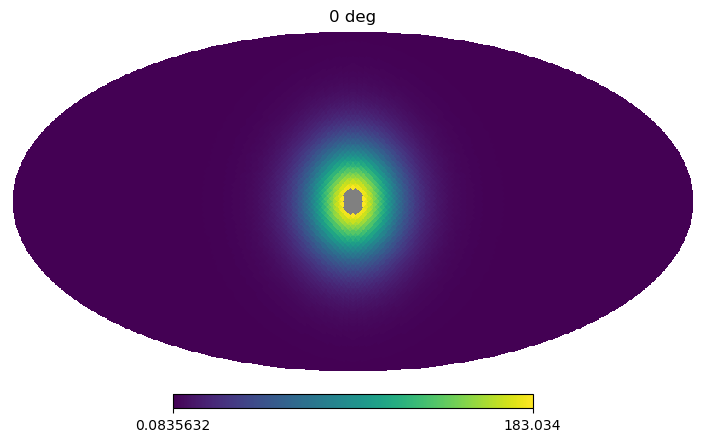

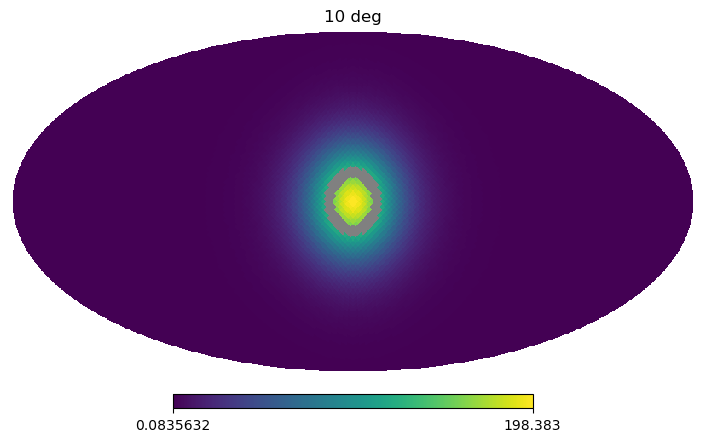

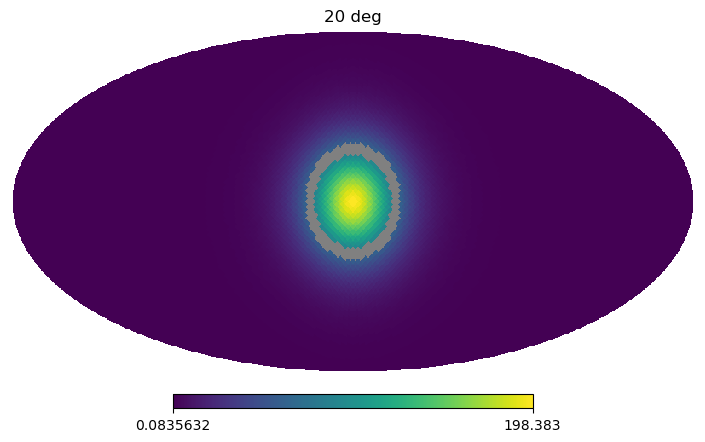

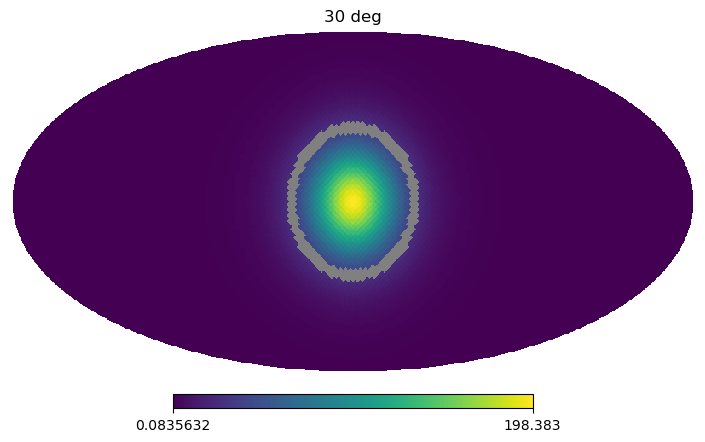

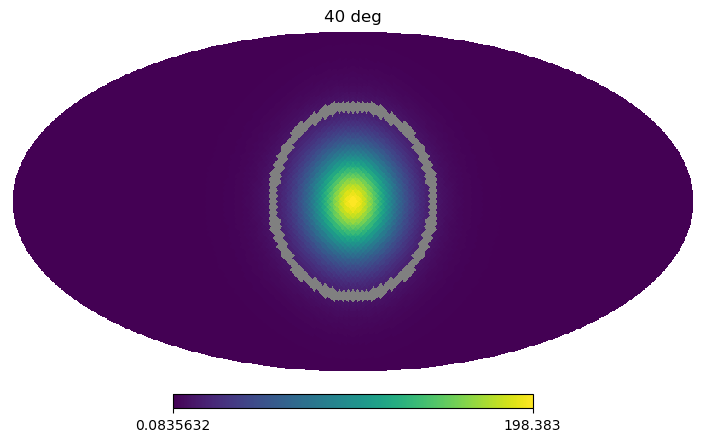

...

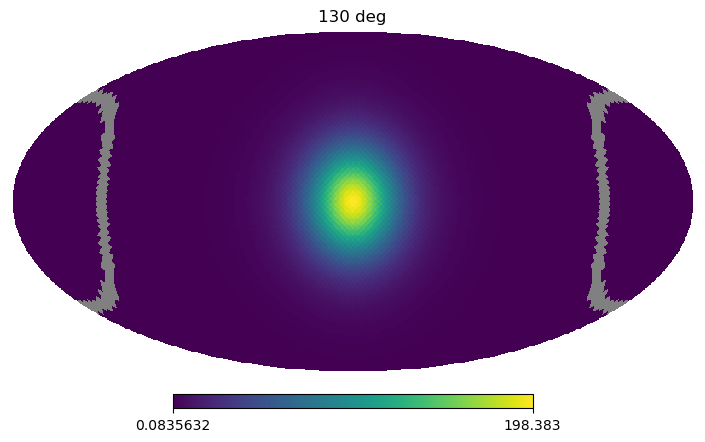

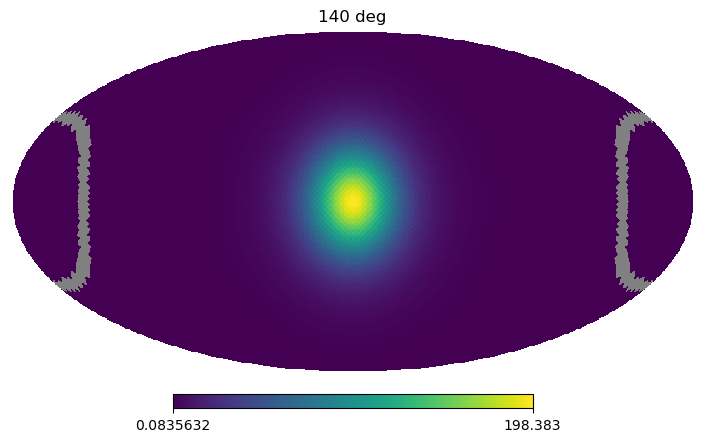

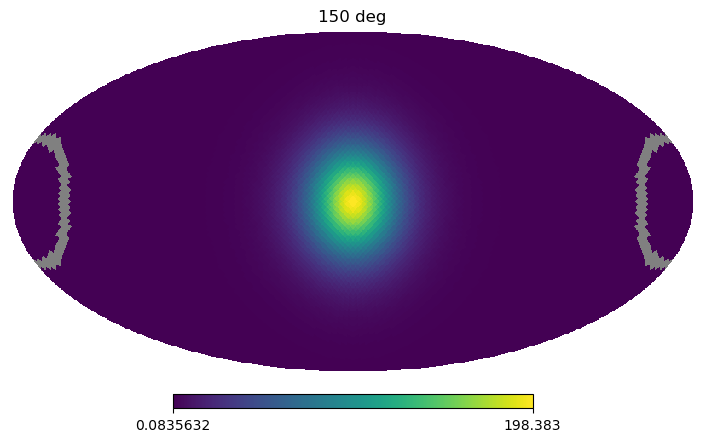

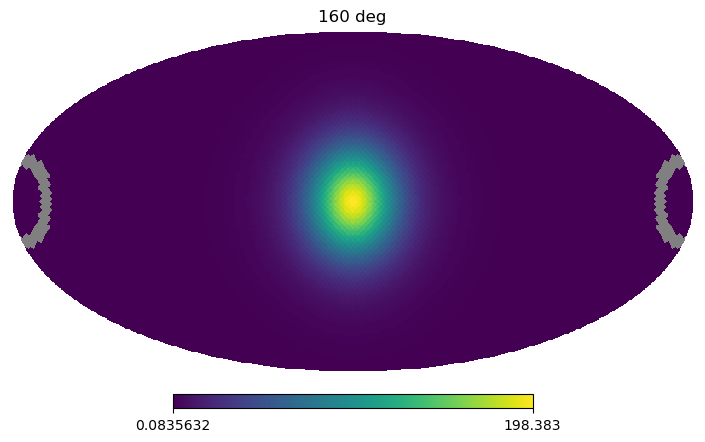

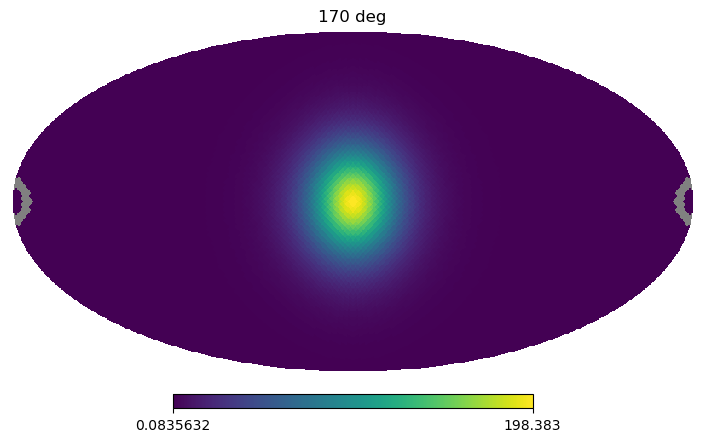

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [7]:
N = 2**5
vec = hp.ang2vec(np.pi/2, 0)
angular_flux = np.zeros(180)

for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 5)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    angular_flux[i] = np.average(F_tot_galex[pix_ring]).value
    
    if i % 10 == 0:
        f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        plot_with_ring = F_tot_galex.value.copy()
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring , 
                    title=str(i) + " deg", 
                    rot=(0,0,0), 
                    fig=f1, 
                    unit="")
        plt.show()

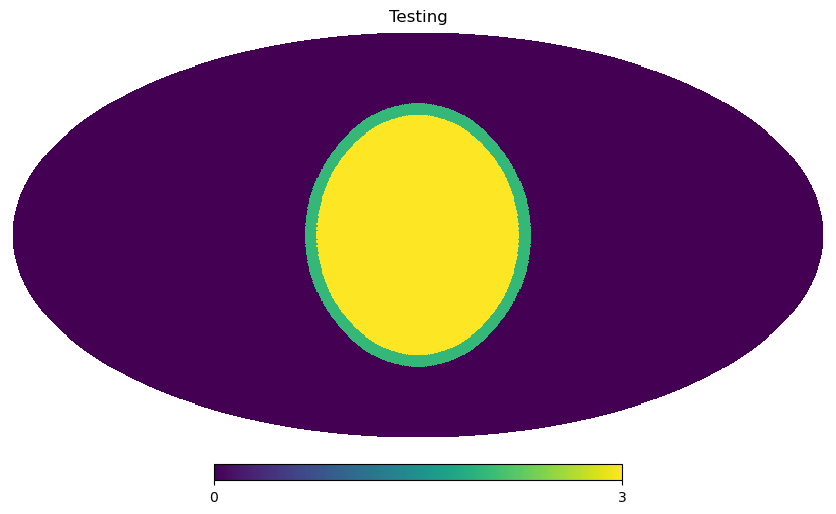

In [10]:
N = 2**8
test_array = np.zeros(hp.nside2npix(N))

# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)

dir1 = [np.pi/2, 0]
dir2 = [np.pi/4, 0]
dir3 = [3*np.pi/4, 0]
dir4 = [np.pi/2, np.pi/4]

test_array[hp.pixelfunc.ang2pix(N, theta=dir1[0], phi=dir1[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir2[0], phi=dir2[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir3[0], phi=dir3[1])] = 1
test_array[hp.pixelfunc.ang2pix(N, theta=dir4[0], phi=dir4[1])] = 1


# Set the radius to 5 degrees
dtheta_deg = 5
radius_inner = np.radians(45)
radius_outer = np.radians(45 + dtheta_deg)

# Select the pixels within the disc
pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)
pix_ring = np.setdiff1d(pix_outer, pix_inner)



test_array[pix_outer] = 2
test_array[pix_inner] = 3
test_array[pix_ring] = 2

hp.mollview(test_array , 
            title="Testing", 
            rot=(0,0,0))


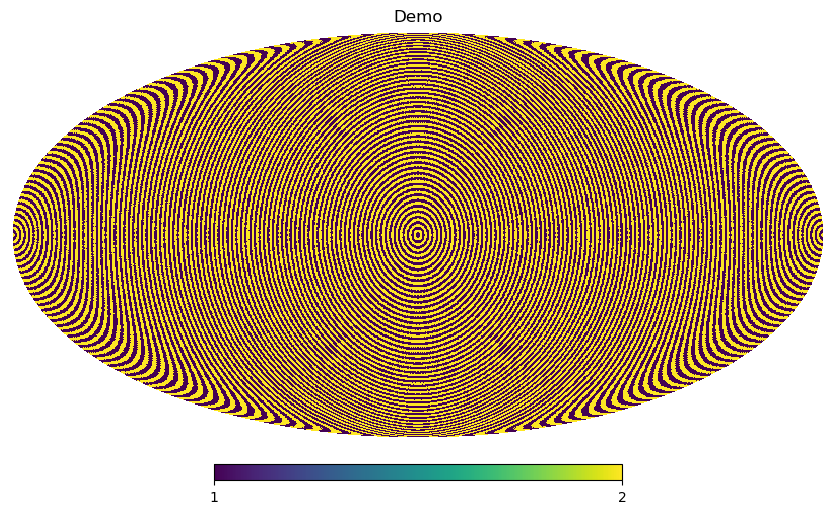

In [11]:
N = 2**8
test_array = np.zeros(hp.nside2npix(N))

# test_array[pix_outer] = 1
# test_array[pix_inner] = 2
# test_array[pix_ring] = 1

# Convert the celestial pole to a unit vector
vec = hp.ang2vec(np.pi/2, 0)


for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 1)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    test_array[pix_ring] = i % 2 + 1
    
hp.mollview(test_array , 
            title="Demo", 
            rot=(0,0,0))


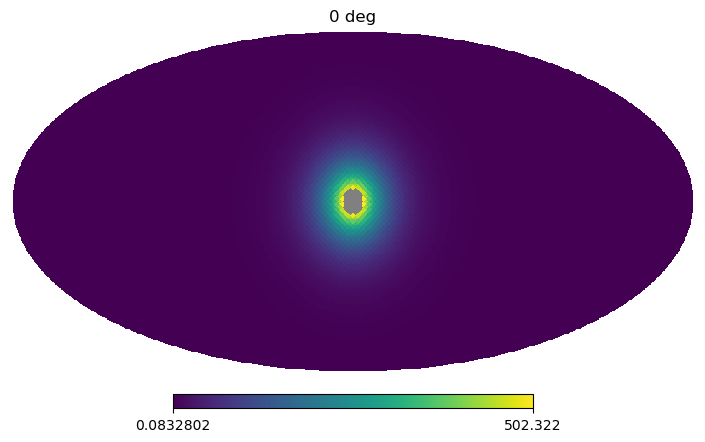

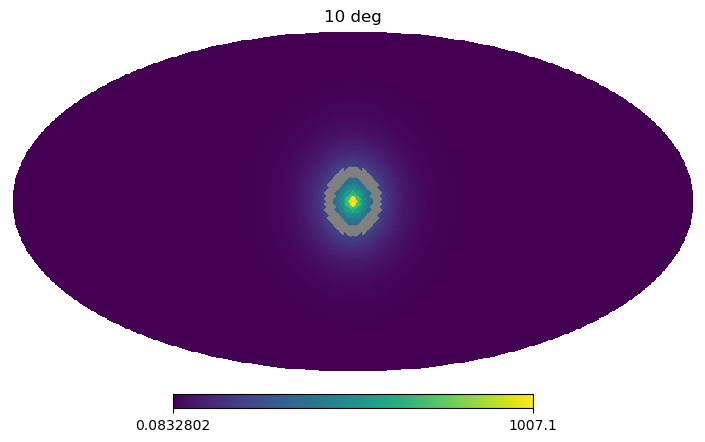

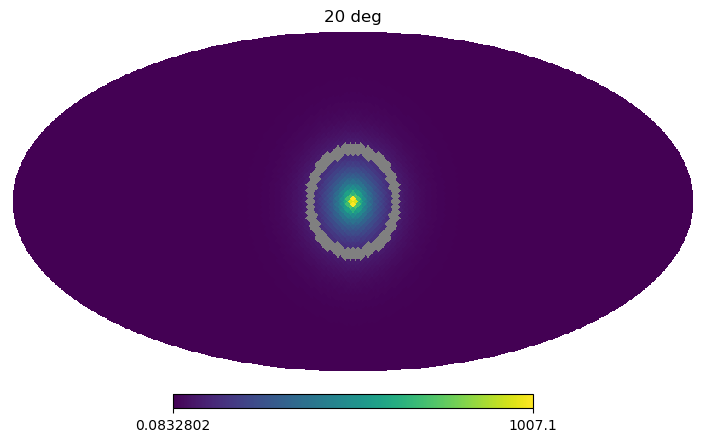

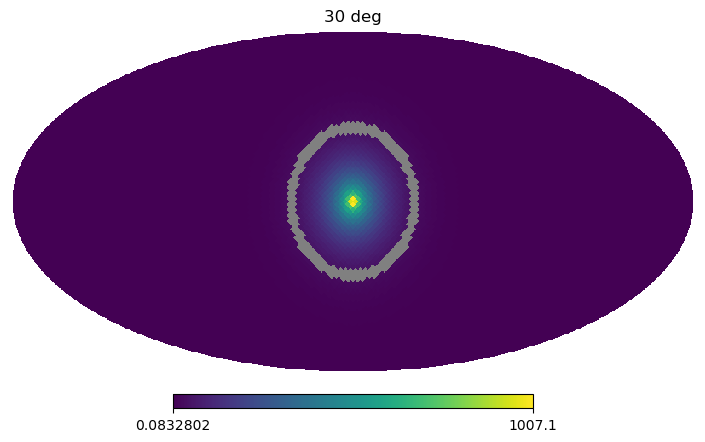

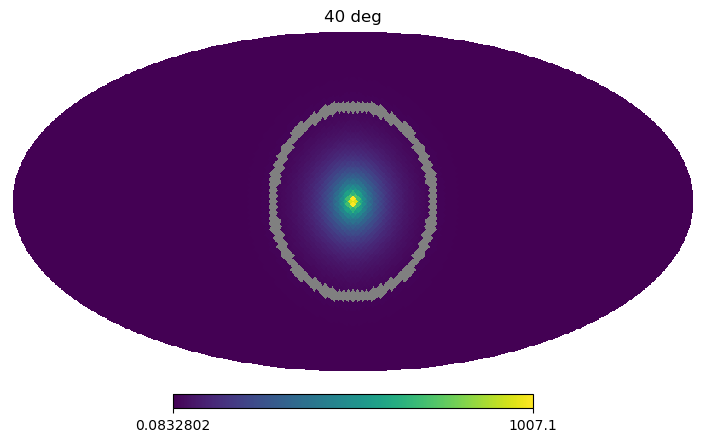

...

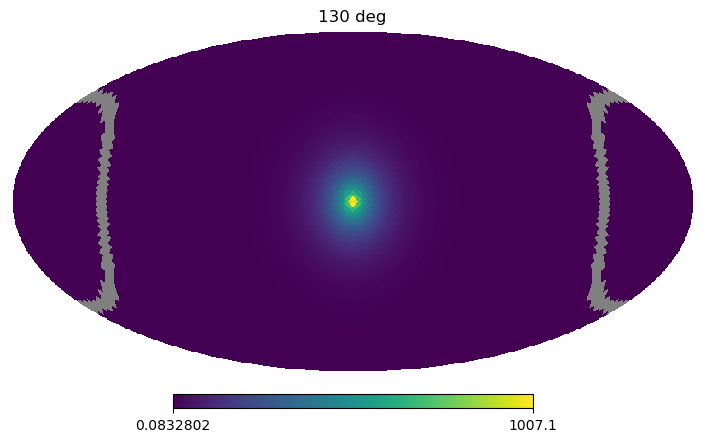

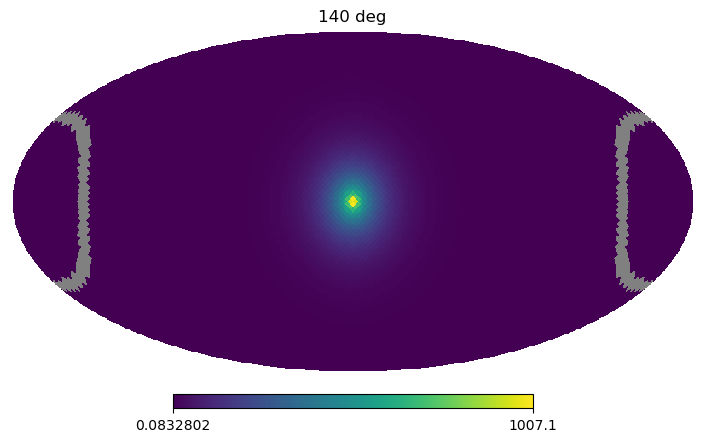

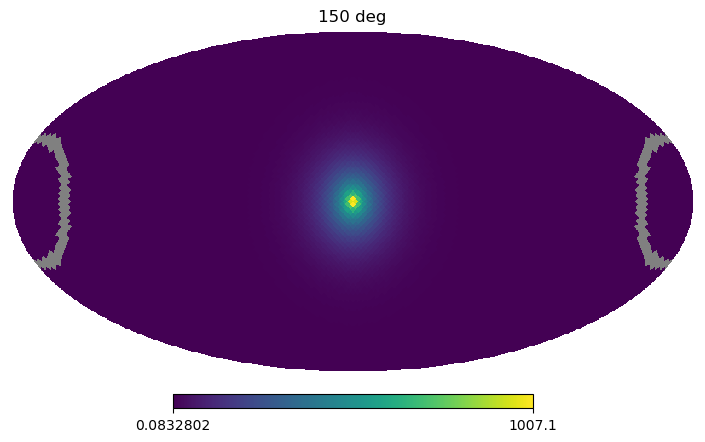

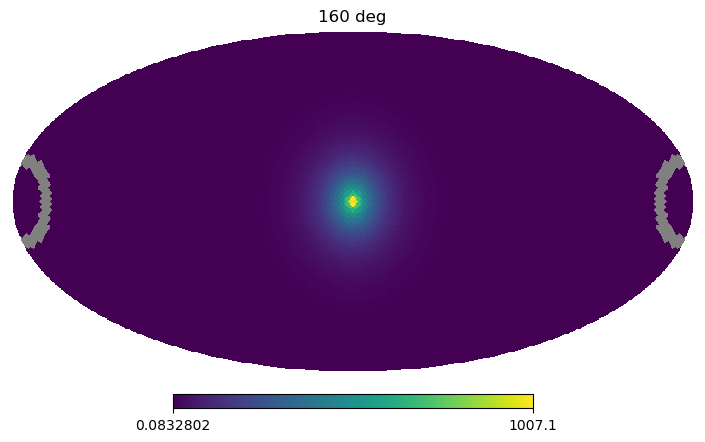

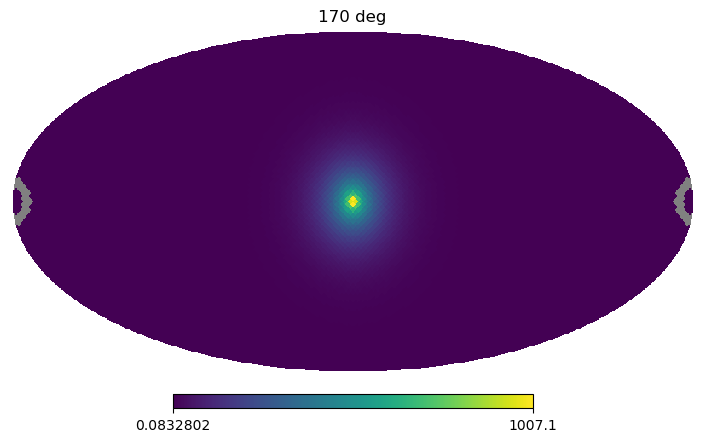

/opt/conda/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/opt/conda/lib/python3.9/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [12]:
N = 2**5
angular_flux = np.zeros(180)

for i in np.arange(0,180,1):
    radius_inner = np.radians(i)
    radius_outer = np.radians(i + 5)
    
    pix_inner = hp.query_disc(N, vec, radius_inner, inclusive = False)
    pix_outer = hp.query_disc(N, vec, radius_outer, inclusive = False)

    pix_ring = np.setdiff1d(pix_outer, pix_inner)
    
    angular_flux[i] = np.average(F_tot_galex[pix_ring]).value
    
    if i % 10 == 0:
        f1 = plt.figure(figsize=(7.5,4.5), dpi=100)
        plot_with_ring = F_tot_galex.value.copy()
        plot_with_ring[pix_ring] = np.nan
        hp.mollview(plot_with_ring , 
                    title=str(i) + " deg", 
                    rot=(0,0,0), 
                    fig=f1, 
                    unit="")
        plt.show()

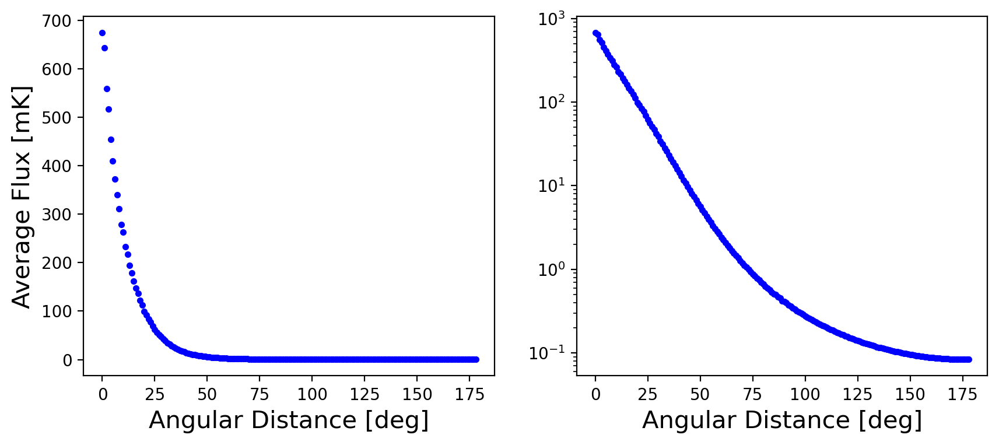

In [14]:
# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(10, 4), dpi=200)

# Plot the data on the left subplot
ax1.plot(np.arange(0,180,1),angular_flux, '.', color='blue')
ax1.set_xlabel('Angular Distance [deg]', size=15)
ax1.set_ylabel('Average Flux [mK]', size=15)

# Plot the data on the right subplot with a log scale on the y-axis
ax2.plot(np.arange(0,180,1),angular_flux, '.', color='blue')
ax2.set_xlabel('Angular Distance [deg]', size=15)
ax2.set_yscale('log')

# Show the plot
plt.show()

Using $\Delta \theta = 5^{\circ}$
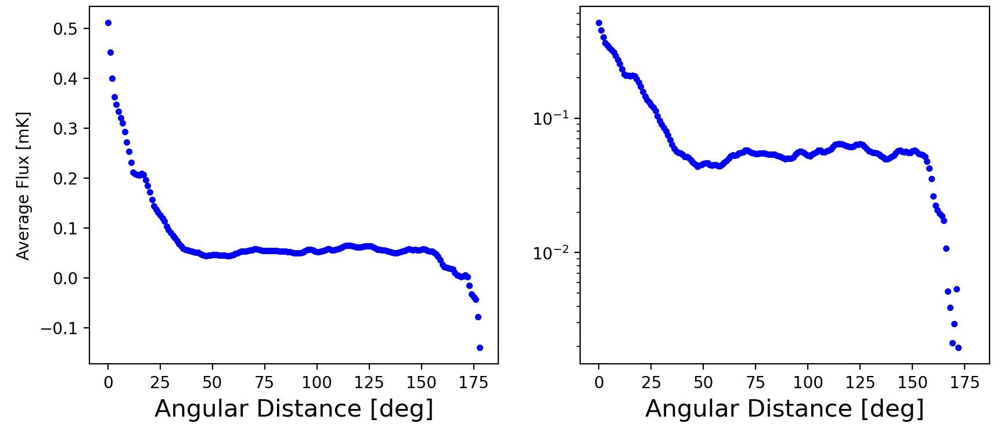

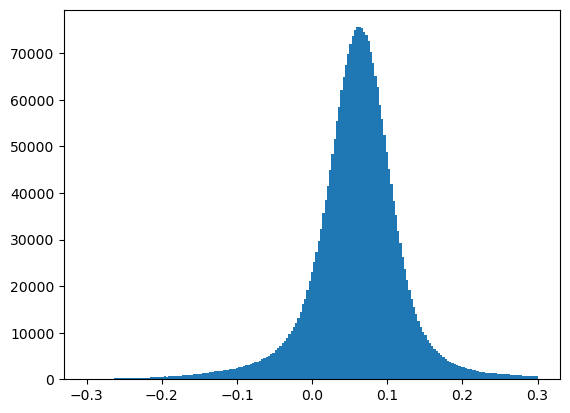

In [267]:
plt.hist(wmaphaze[np.where(wmaphaze != 0)], bins = np.linspace(-0.3,0.3,200))
#plt.xlim([-0.5,0.5])
plt.show()

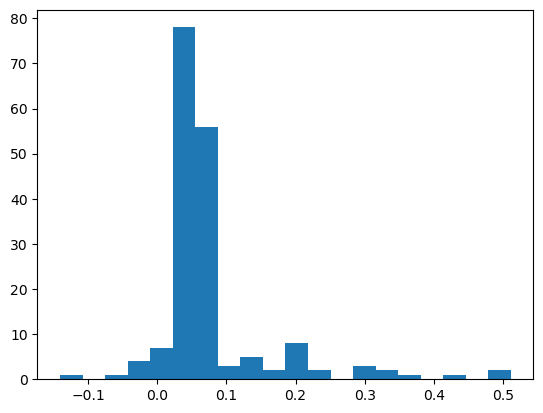

In [271]:
plt.hist(angular_flux_wmap, bins=20)
#plt.xlim([-0.5,0.5])
plt.show()

In [207]:
np.nan

nan

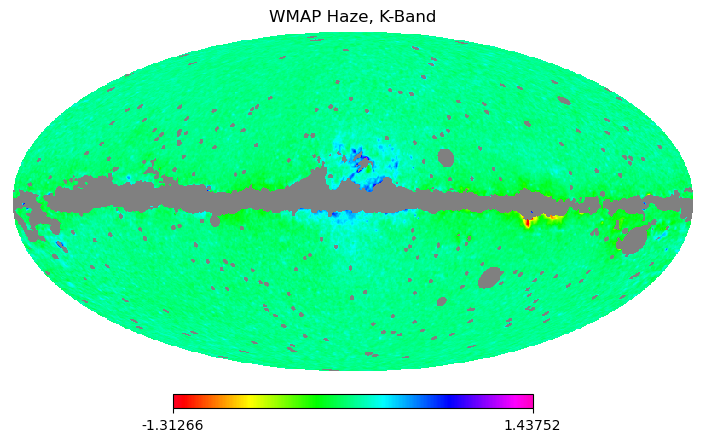

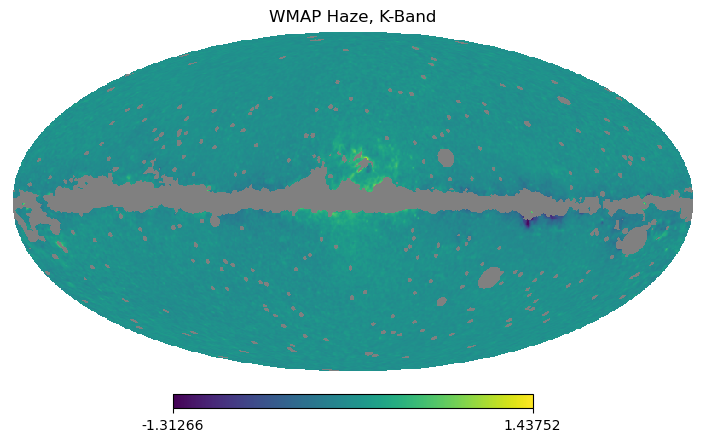

## MCMC Analysis


In [22]:
import corner

In [104]:
inner = np.array([1,11,117,5])
outer = np.array([1,11,117,0,123,5])

np.setdiff1d(outer, inner)

array([  0, 123])

In [99]:
len(pix_inner)

115144

In [68]:
print(hp.rotator.angdist(dir1, dir2),
      hp.rotator.angdist(dir1, dir3),
      hp.rotator.angdist(dir1, dir4))

[0.78539816] [0.78539816] [0.78539816]


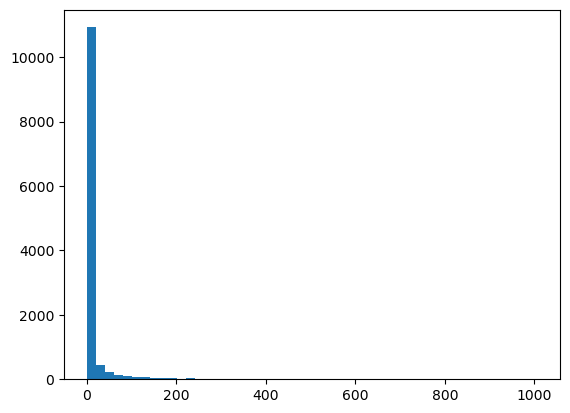

In [26]:
plt.hist(F_tot_galex.value, bins=50)
plt.show()

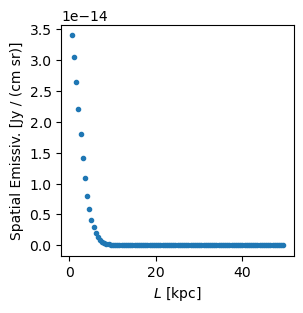

Unit("Jy / (cm sr)")

In [ ]:
spectral_spatial_emissivity
# integrate along the bandwidth
# calculate spectral spatial emissivity


plt.figure(dpi=100,figsize=(3,3))
plt.plot(l_list,spectral_spatial_emissivity[:,500], ".")
plt.xlabel("$L$ [kpc]")
plt.ylabel("Spatial Emissiv. ["+str(spectral_spatial_emissivity.unit)+"]")
plt.show()
spectral_spatial_emissivity.unit

In [56]:
frequency_band = np.arange(f_min_hz.value, f_max_hz.value, frequency_band_resolution) * u.Hz
frequency_band

<Quantity [2.025e+10, 2.125e+10, 2.225e+10, 2.325e+10, 2.425e+10,
           2.525e+10] Hz>

In [54]:
f_min_hz

<Quantity 2.025e+10 Hz>

In [55]:
f_max_hz

<Quantity 2.575e+10 Hz>

In [50]:
# sightline elements
l_min_kpc = l_min*u.kpc
l_max_kpc = l_max*u.kpc
l_list = np.arange(l_min_kpc.value,l_max_kpc.value,dl.value)[:, np.newaxis]
len(l_list)

frequency_band.to(u.GHz)

<Quantity [20.25] GHz>

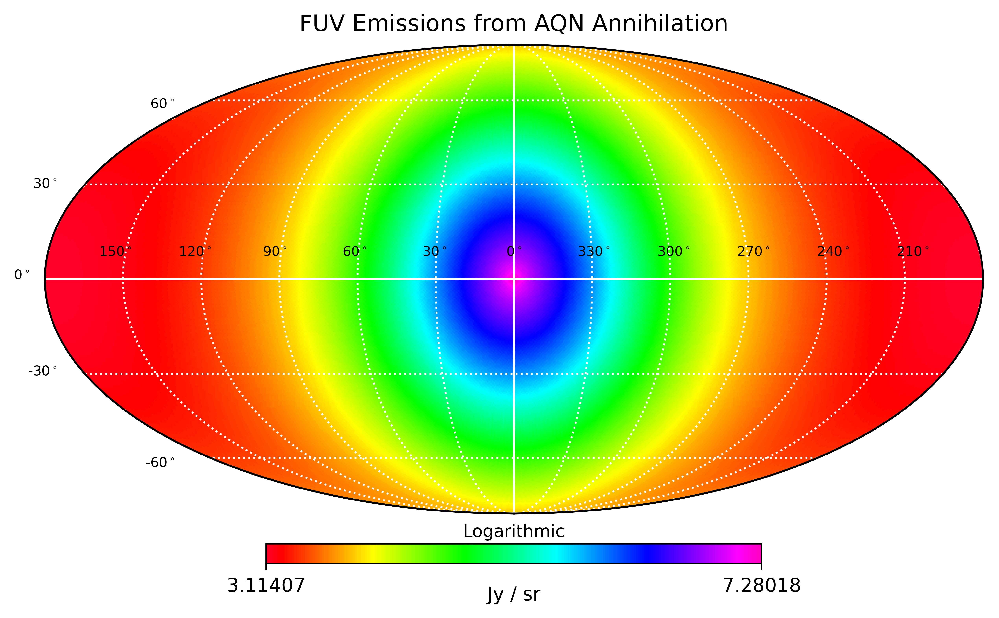

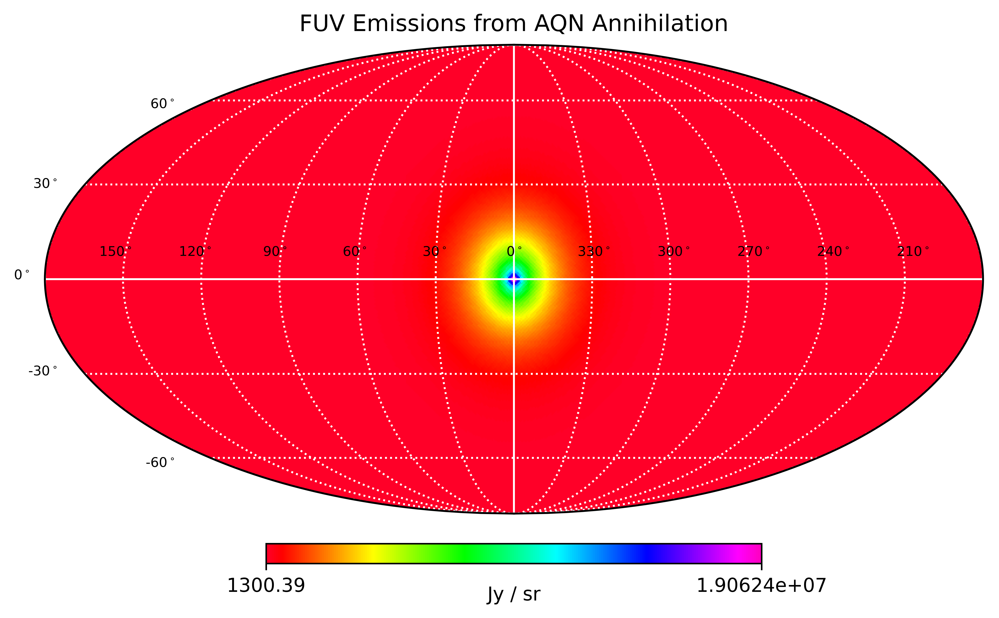

In [81]:
create_skymap2(F_tot_galex, F_tot_galex.unit, False)

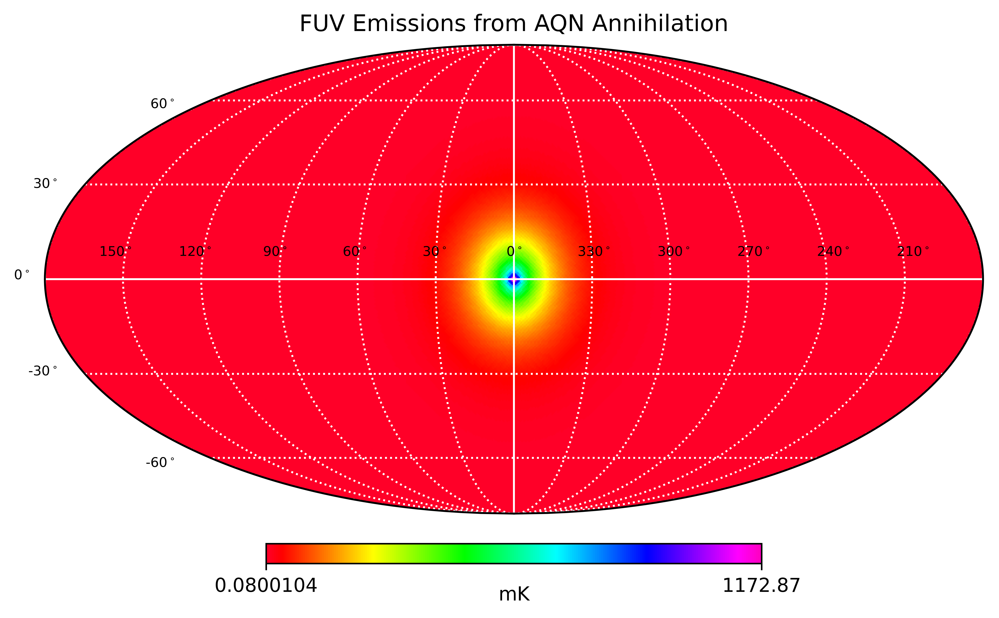

In [85]:
create_skymap2(F_tot_galex.to(u.mK, u.brightness_temperature(23*u.GHz)), str("mK"), False)

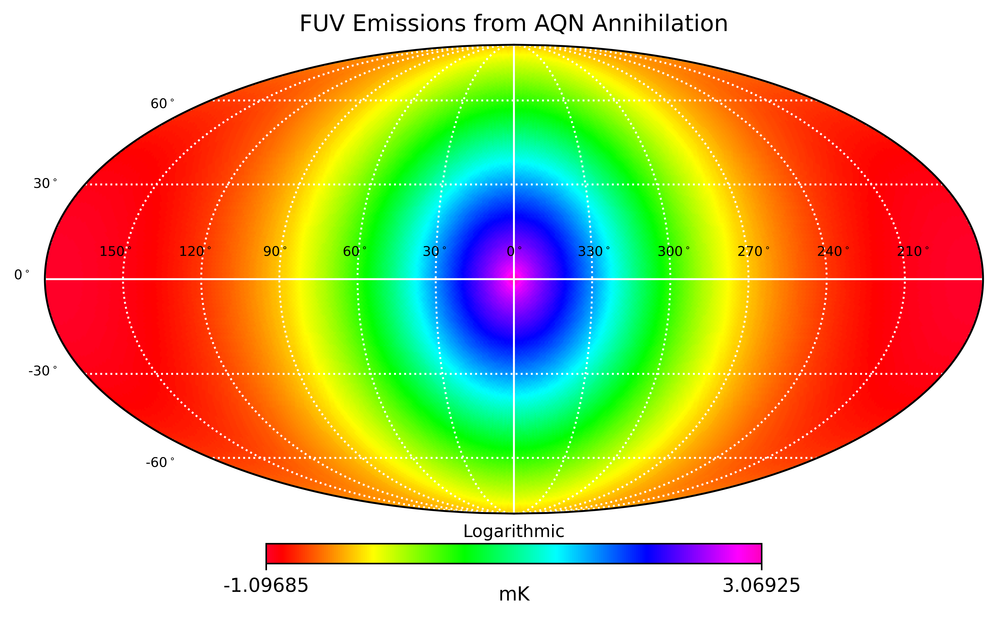

In [84]:
create_skymap2(F_tot_galex.to(u.mK, u.brightness_temperature(23*u.GHz)), str("mK"), True)

In [146]:
l_array[5]

array([3.1, 3.1, 3.1, ..., 3.1, 3.1, 3.1])

## Look at $T_{\text{AQN}}$ from a gas component at a particular distance from earth



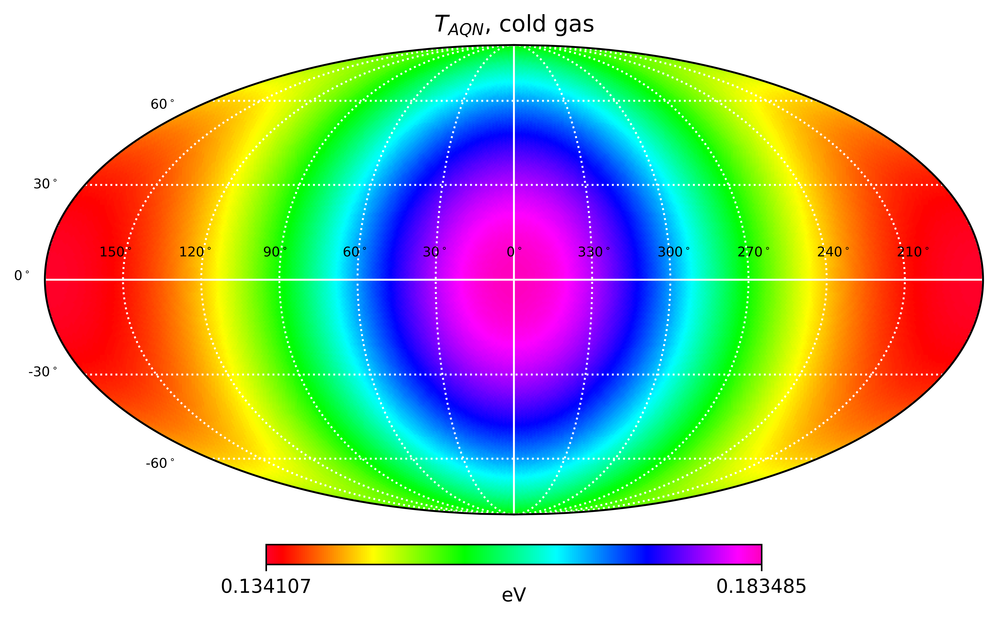

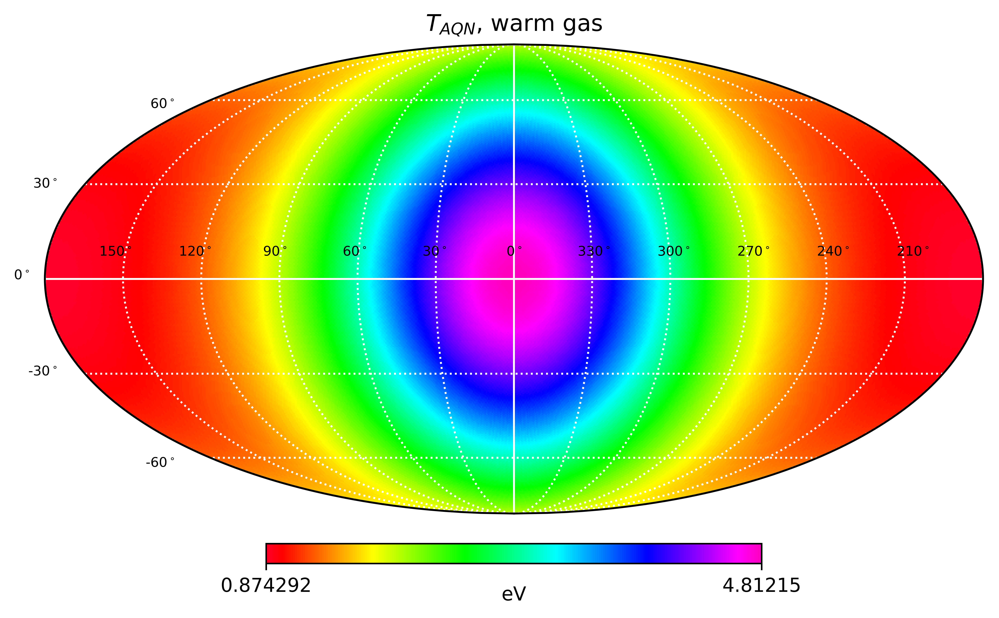

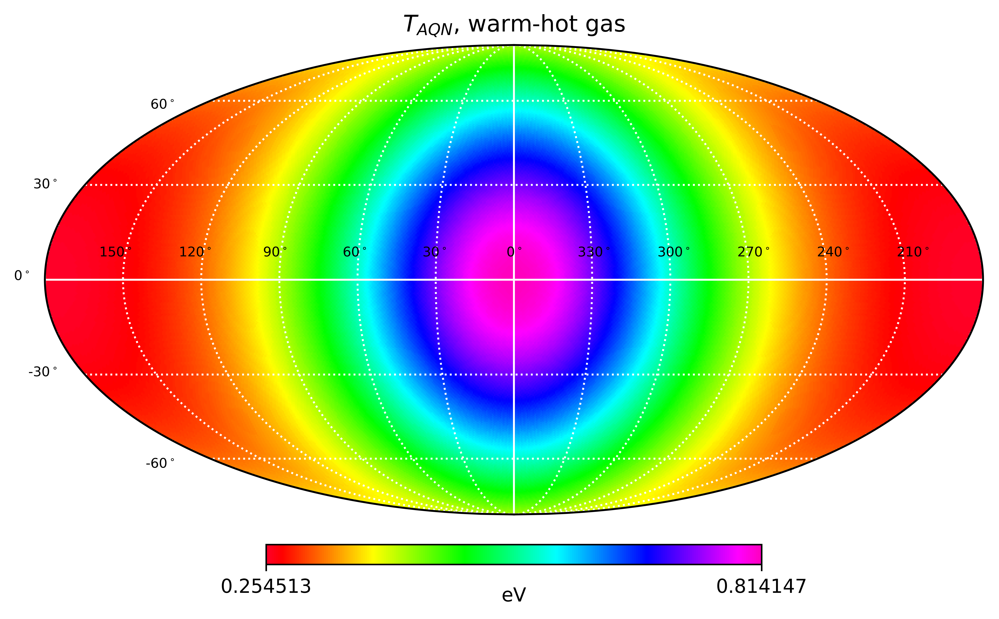

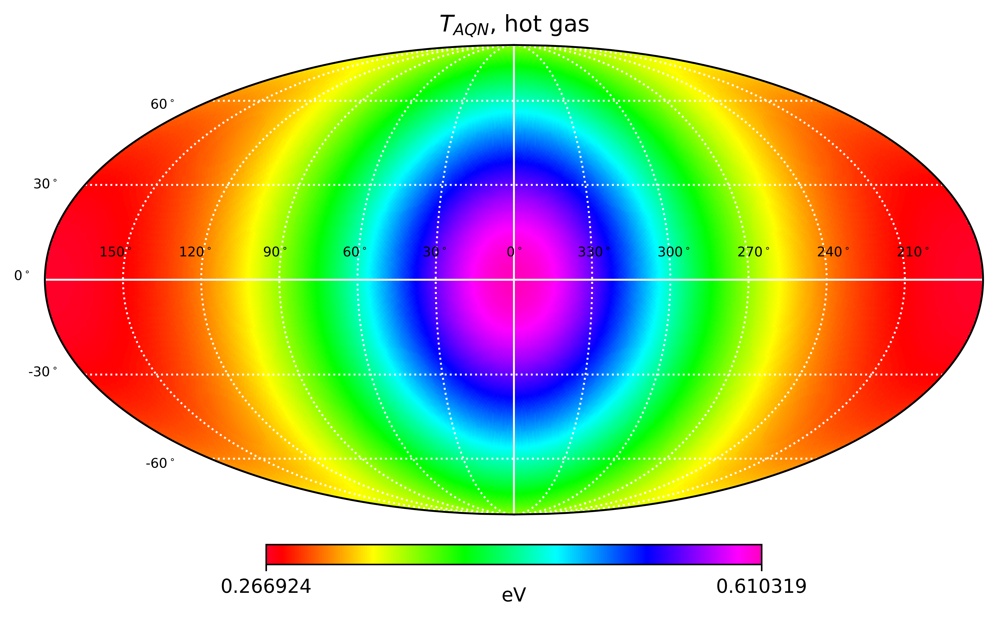

In [42]:
l_array_index = 5
create_skymap_T_aqn(T_aqn_dict_ev["cold"    ][l_array_index,:], "cold gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm"    ][l_array_index,:], "warm gas"    )
create_skymap_T_aqn(T_aqn_dict_ev["warm_hot"][l_array_index,:], "warm-hot gas")
create_skymap_T_aqn(T_aqn_dict_ev["hot"     ][l_array_index,:], "hot gas"     )

In [80]:
np.where(theta<=0.05)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23]),)

In [83]:
NSIDE

64

In [88]:
hp.pixelfunc.ang2pix(NSIDE, theta=1, phi=0)

11392

In [91]:
npix = hp.nside2npix(2**3)

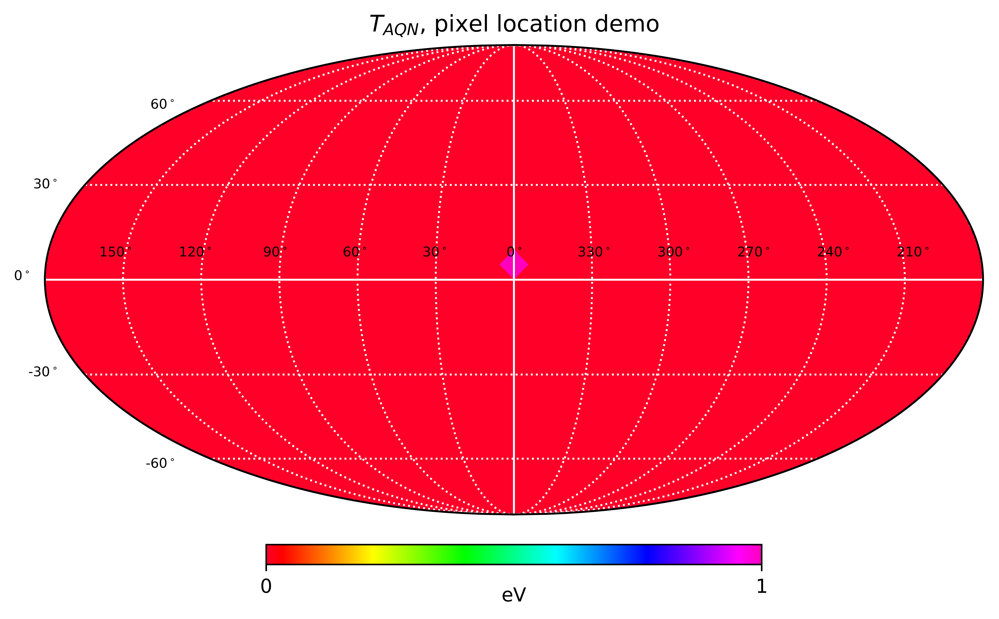

In [125]:
test_array = np.zeros(npix)
test_array[hp.pixelfunc.ang2pix(2**3, theta=np.pi/2, phi=0)] = 1

create_skymap_T_aqn(test_array*u.cm, "pixel location demo")

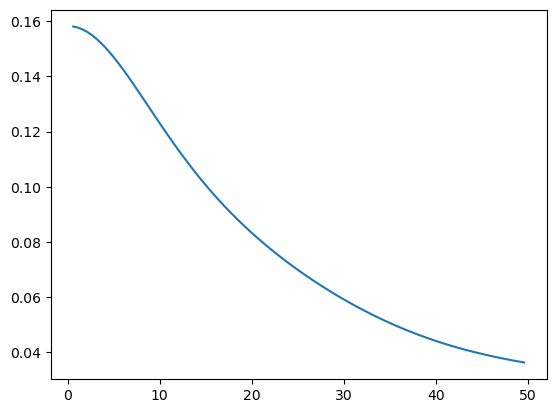

In [117]:
pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=0, phi=0)
plt.plot(l_array[:,pixel_index],T_aqn_dict_ev["cold"][:,pixel_index])

In [153]:
def plot_temperature_vs_l(T_dict, chosen_theta, chosen_phi):

    pixel_index = hp.pixelfunc.ang2pix(NSIDE, theta=chosen_theta, phi=chosen_phi)

    npix = hp.nside2npix(2**3)
    test_array = np.zeros(npix)
    test_array[hp.pixelfunc.ang2pix(2**3, theta=chosen_theta, phi=chosen_phi)] = 1
    #create_skymap_T_aqn(test_array*u.cm, "pixel location demo")
    hp.mollview(test_array)
    plt.show()


    # Create a 2x2 grid of subplots
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(5, 5), dpi=200)

    # Define the titles for each subplot
    titles = ['cold', 'warm', 'warm_hot', 'hot']

    # Loop through each subplot and add a plot with the given title
    for i, ax in enumerate(axes.flat):
        ax.plot(l_array[:,pixel_index], T_dict[titles[i]][:,pixel_index])
        ax.set_title(titles[i]+" gas")
        #ax.set_xlabel('Distance (earth centric) [kpc]')
        #ax.set_ylabel('$T_{AQN}$ (eV)')
    axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
    axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
    # Adjust the layout and padding of the subplots
    fig.tight_layout(pad=3.0)

    fig.suptitle(r'$\theta = $'+str(round(chosen_theta,4))+', $\phi = $'+str(round(chosen_phi,4)), fontsize=18)

    # Display the figure
    plt.show()

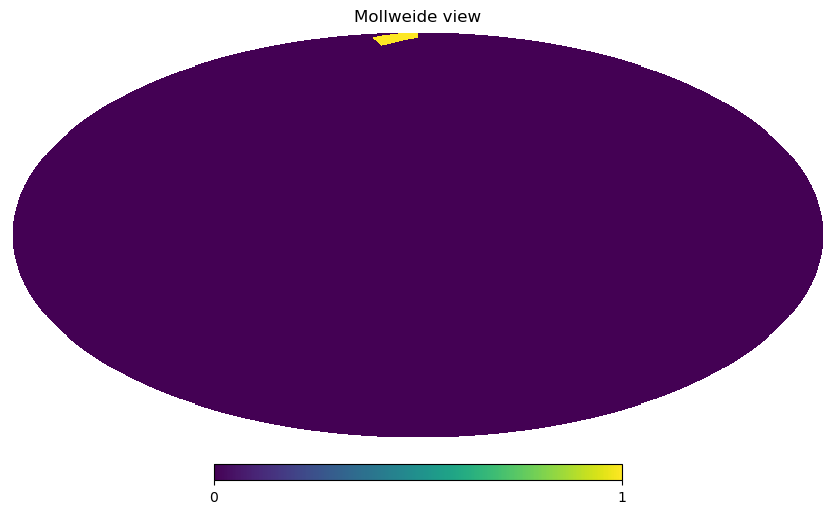

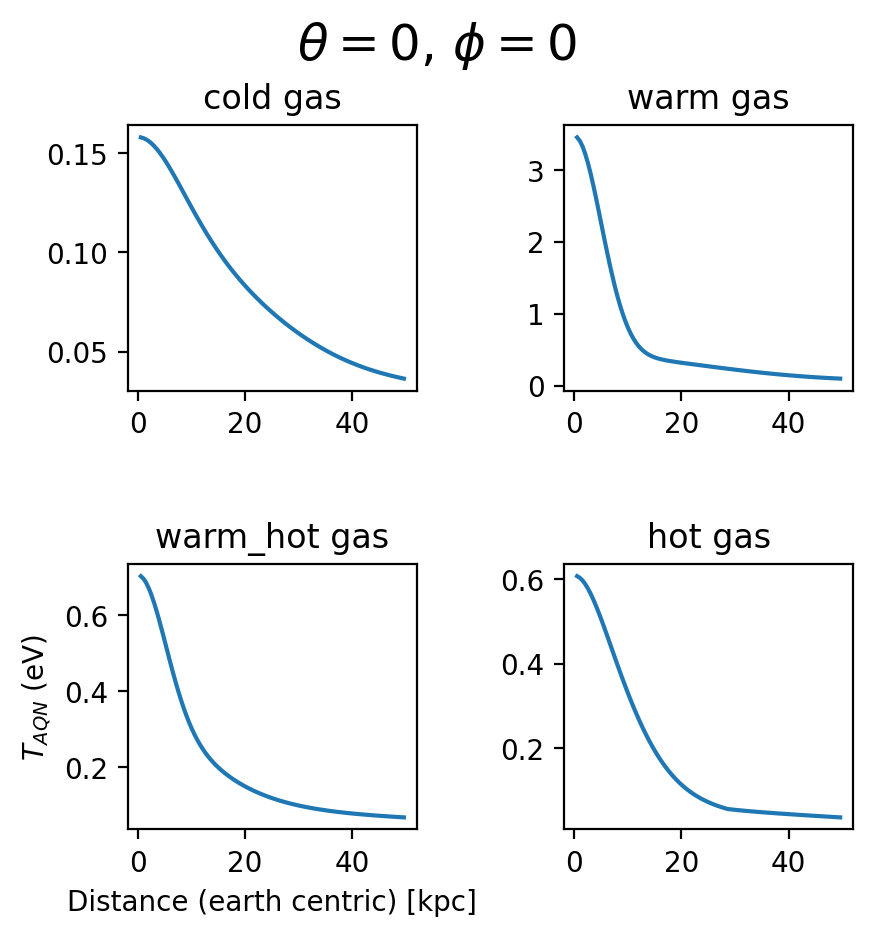

In [154]:
chosen_theta = 0
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



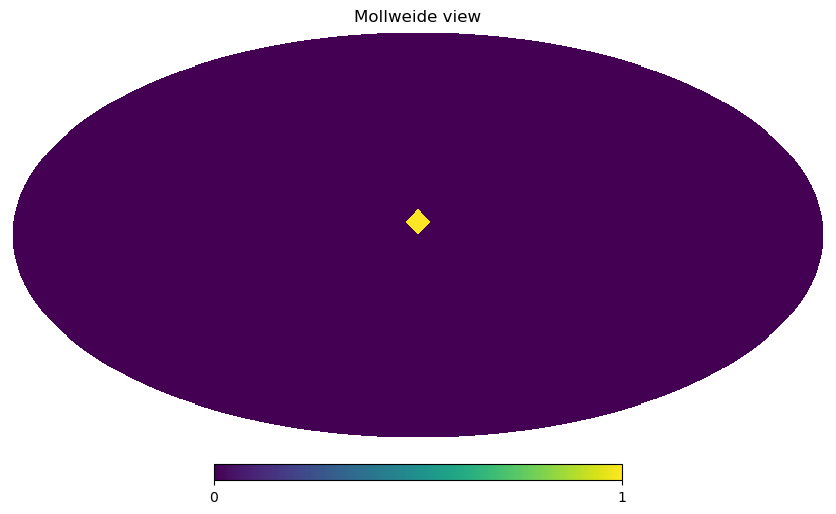

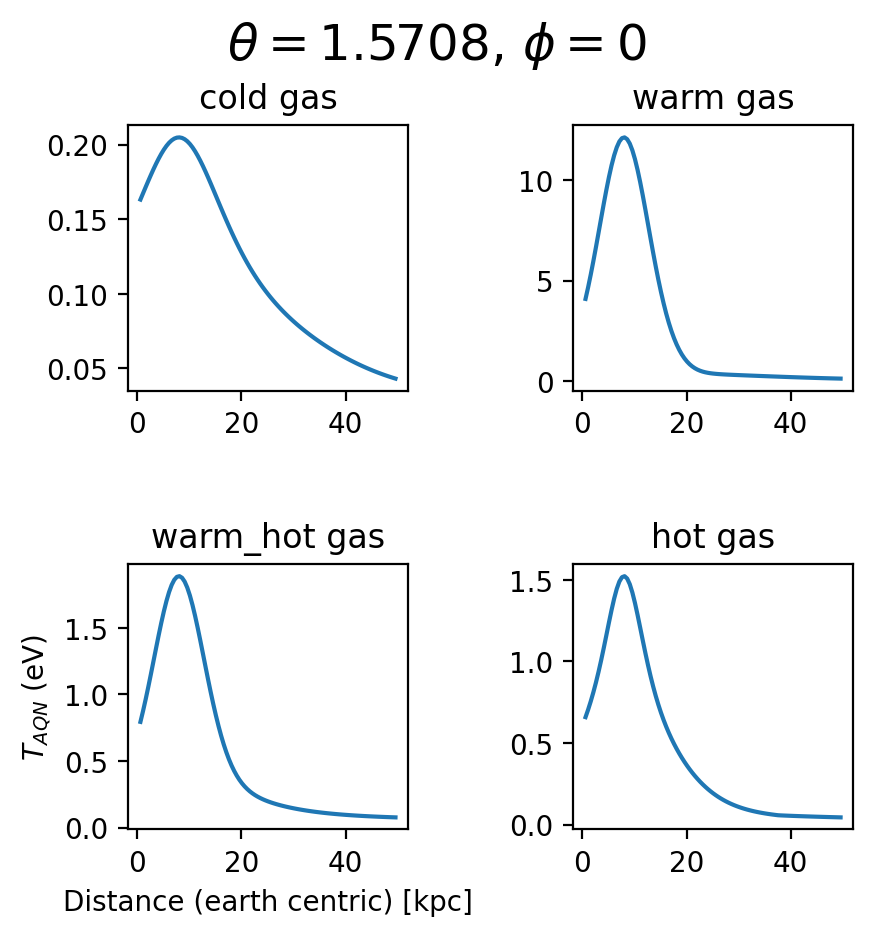

In [155]:
chosen_theta = np.pi/2
chosen_phi   = 0

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



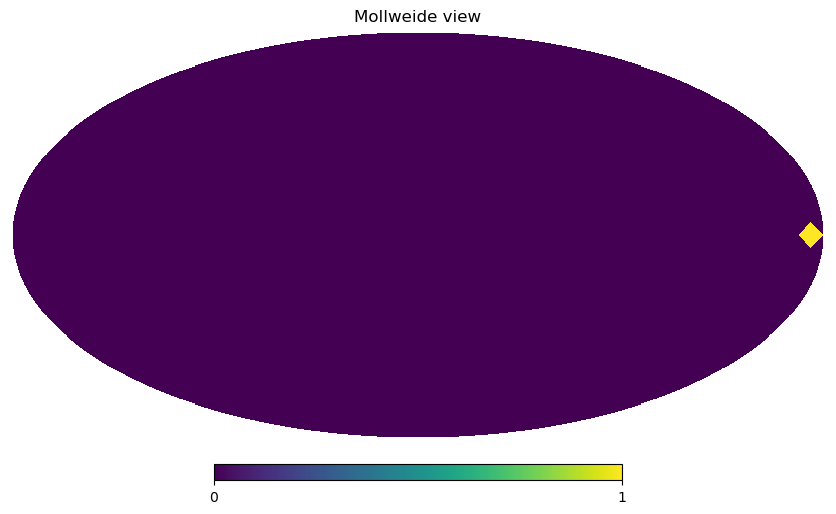

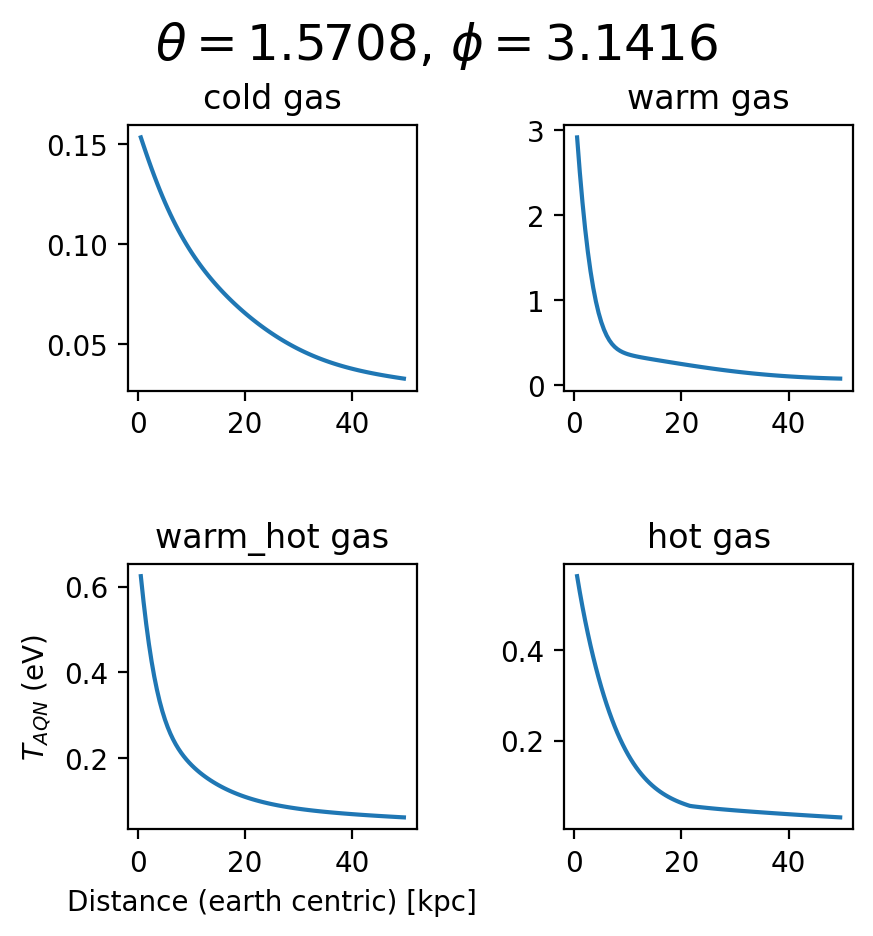

In [156]:
chosen_theta = np.pi/2
chosen_phi   = np.pi

plot_temperature_vs_l(T_aqn_dict_ev, chosen_theta, chosen_phi)



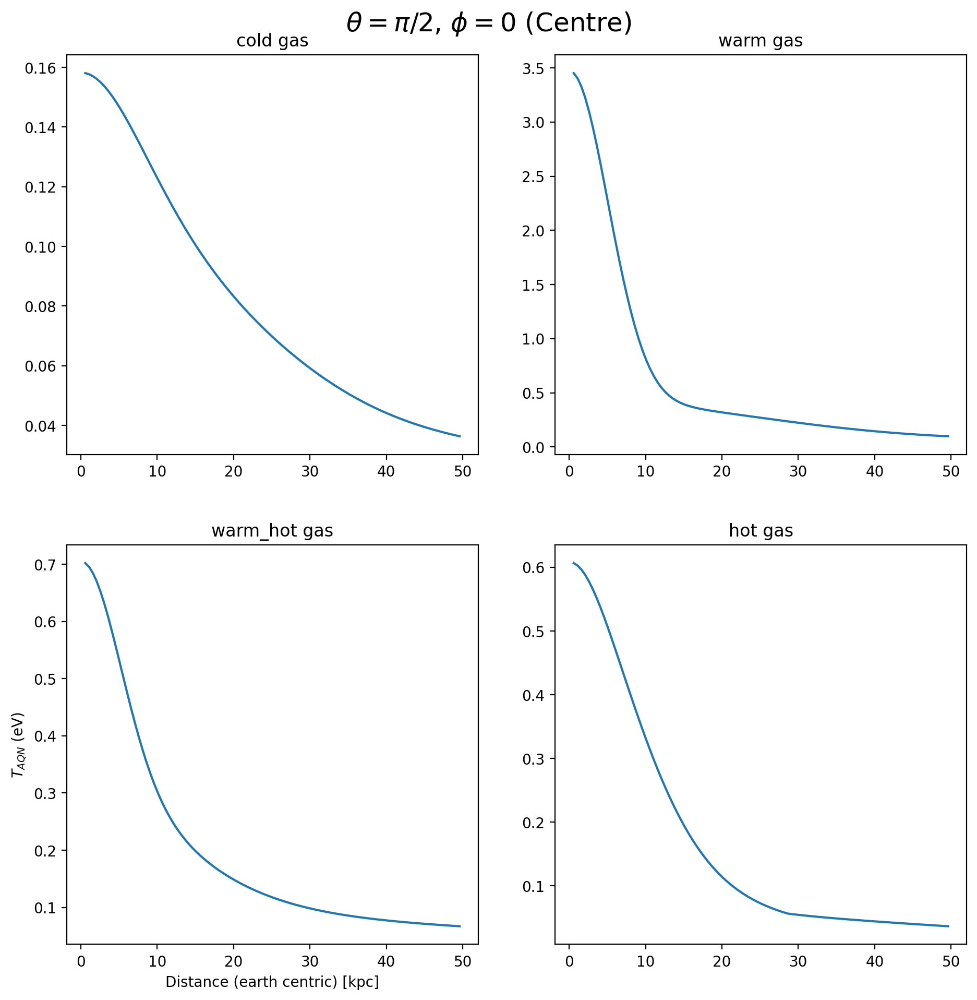

In [127]:
chosen_theta = np.pi
chosen_phi   = 0

# Create a 2x2 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10), dpi=200)

# Define the titles for each subplot
titles = ['cold', 'warm', 'warm_hot', 'hot']

# Loop through each subplot and add a plot with the given title
for i, ax in enumerate(axes.flat):
    ax.plot(l_array[:,pixel_index], T_aqn_dict_ev[titles[i]][:,pixel_index])
    ax.set_title(titles[i]+" gas")
    #ax.set_xlabel('Distance (earth centric) [kpc]')
    #ax.set_ylabel('$T_{AQN}$ (eV)')
axes[1][0].set_xlabel('Distance (earth centric) [kpc]')
axes[1][0].set_ylabel('$T_{AQN}$ (eV)')
# Adjust the layout and padding of the subplots
fig.tight_layout(pad=3.0)

fig.suptitle(r'$\theta = \pi/2$, $\phi = 0$ (Centre)', fontsize=18)

# Display the figure
plt.show()


In [115]:
len(l_array)

99

In [102]:
def calc_T_aqn(n_AQN, n_bar, Dv, f, g, T_gas, R_AQN, nu):
    T_neu_eV = T_AQN_analytical(n_bar, Dv, f, g)
    T_ion_eV = T_AQN_ionized2(n_bar, Dv, f, g, T_gas, R_AQN)
    T_AQN = T_neu_eV.copy()                   # don't need this, use T_neu_eV
    ion_greater_neu = np.where(T_ion_eV > T_neu_eV)
    T_AQN[ion_greater_neu] = T_ion_eV[ion_greater_neu]
    #dFdw = spectral_surface_emissivity(T_AQN, frequency_band)
    #dF = np.sum(dFdw,2)
    return T_AQN


warm_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm,  Dv, f, g, T_warm,     R_aqn_cm, frequency_band)
warm_hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_warm_hot, Dv, f, g, T_warm_hot, R_aqn_cm, frequency_band)
hot_T_aqn = calc_T_aqn( n_aqn_cm3, n_hot,  Dv, f, g, T_hot,      R_aqn_cm, frequency_band)

<Quantity [10081.15962289,  9506.08046891,  9506.08046891, ...,
            9506.08046891,  9506.08046891, 10081.15962289] cm>

In [ ]:
# pick line of sight away from galactic centre, directly north
# look at T_AQN along this line of sight